# AIR POLLUTION PREDICTION USING MACHINE LEARNING

# Connecting to Google Drive

In [2]:
# Connecting Google Colab to Google Drive
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


# Setting current working directory to project folder

In [3]:
PWD = "gdrive/MyDrive/Projects/Hameedat Air Pollutant Forecast"
DATASET_PATH = f'PRSA_Data'
MODEL_PATH = f'models'
RESULTS_PATH = f'results'
CLEANED_DATASET_PATH = 'cleaned_datasets'

# setting working directory
%cd {PWD}

/content/gdrive/MyDrive/Projects/Hameedat Air Pollutant Forecast


In [4]:
# Creating appropriate folders if not already existing

import os

if not os.path.exists(DATASET_PATH):
    os.mkdir(DATASET_PATH)

if not os.path.exists(MODEL_PATH):
    os.mkdir(MODEL_PATH)

if not os.path.exists(RESULTS_PATH):
    os.mkdir(RESULTS_PATH)

if not os.path.exists(CLEANED_DATASET_PATH):
    os.mkdir(CLEANED_DATASET_PATH)


# Importing libararies

In [5]:
# Utilities
import os
import pickle
from math import sqrt
from numpy import log

# Data wrangling and loader
import pandas as pd
import numpy as np

# Visualizations
import seaborn as sns
import matplotlib.pyplot as plt

# Data preprocessing
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, KFold

# Testing for stationarity of forecast variable
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

# Regressors
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor

# Performance metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Suppressing unnecessary warnings
import warnings
warnings.filterwarnings("ignore")

# Allowing Auto-viewing of plots without having to call plt.show() everytime
%matplotlib inline

In [6]:
# Default plotting configurations
sns.set_style('darkgrid')
plt.rcParams['figure.figsize']=(15,8)
plt.rcParams['font.size']=18

# Loading datasets

In [7]:
#import five Beijng mulit-site air quality data for different cities
Ao = pd.read_csv("./PRSA_Data/Aotizhongxin.csv")
Ch = pd.read_csv("./PRSA_Data/Changping.csv")
Di = pd.read_csv("./PRSA_Data/Dingling.csv")
Do = pd.read_csv("./PRSA_Data/Dongsi.csv")
Ga = pd.read_csv("./PRSA_Data/Guanyuan.csv")
Gc = pd.read_csv("./PRSA_Data/Gucheng.csv")
Hu = pd.read_csv("./PRSA_Data/Huairou.csv")
No = pd.read_csv("./PRSA_Data/Nongzhanguan.csv")
Sh = pd.read_csv("./PRSA_Data/Shunyi.csv")
Ti = pd.read_csv("./PRSA_Data/Tiantan.csv")
Wa = pd.read_csv("./PRSA_Data/Wanliu.csv")
Ws = pd.read_csv("./PRSA_Data/Wanshouxigong.csv")

# Data Preprocessing

## Exploratory Data Analysis (EDA)

In [ ]:
# View data shape sizes
print("Aotizhongxin Data shape: ", Ao.shape, "\n")
print("Changping Data shape: ", Ch.shape, "\n")
print("Dingling Data shape: ", Di.shape, "\n")
print("Dongsi Data shape: ", Do.shape, "\n")
print("Guanyuan Data shape: ", Ga.shape, "\n")
print("Gucheng Data shape: ", Gc.shape, "\n")
print("Huairou Data shape: ", Hu.shape, "\n")
print("Nongzhanguan Data shape: ", No.shape, "\n")
print("Shunyi Data shape: ", Sh.shape, "\n")
print("Tiantan Data shape: ", Ti.shape, "\n")
print("Wanliu Data shape: ", Wa.shape, "\n")
print("Wanshouxigong Data shape: ", Ws.shape, "\n")



Aotizhongxin Data shape:  (35064, 18) 

Changping Data shape:  (35064, 18) 

Dingling Data shape:  (35064, 18) 

Dongsi Data shape:  (35064, 18) 

Guanyuan Data shape:  (35064, 18) 

Gucheng Data shape:  (35064, 18) 

Huairou Data shape:  (35064, 18) 

Nongzhanguan Data shape:  (35064, 18) 

Shunyi Data shape:  (35064, 18) 

Tiantan Data shape:  (35064, 18) 

Wanliu Data shape:  (35064, 18) 

Wanshouxigong Data shape:  (35064, 18) 



In [ ]:
#view data description
print("Aotizhongxin: \n", Ao.describe(), "\n")
print("Changping: \n", Ch.describe(), "\n")
print("Dingling: \n", Di.describe(), "\n")
print("Dongsi: \n", Do.describe(), "\n")
print("Guanyuan: \n", Ga.describe(), "\n")
print("Gucheng: \n", Gc.describe(), "\n")
print("Huairou: \n", Hu.describe(), "\n")
print("Nongzhanguan: \n", No.describe(), "\n")
print("Shunyi:  \n", Sh.describe(), "\n")
print("Tiantan: \n", Ti.describe(), "\n")
print("Wanliu: \n", Wa.describe(), "\n")
print("Wanshouxigong: \n", Ws.describe(), "\n")

Aotizhongxin: 
                  No          year         month           day          hour  \
count  35064.000000  35064.000000  35064.000000  35064.000000  35064.000000   
mean   17532.500000   2014.662560      6.522930     15.729637     11.500000   
std    10122.249256      1.177213      3.448752      8.800218      6.922285   
min        1.000000   2013.000000      1.000000      1.000000      0.000000   
25%     8766.750000   2014.000000      4.000000      8.000000      5.750000   
50%    17532.500000   2015.000000      7.000000     16.000000     11.500000   
75%    26298.250000   2016.000000     10.000000     23.000000     17.250000   
max    35064.000000   2017.000000     12.000000     31.000000     23.000000   

              PM2.5          PM10           SO2           NO2            CO  \
count  34139.000000  34346.000000  34129.000000  34041.000000  33288.000000   
mean      82.773611    110.060391     17.375901     59.305833   1262.945145   
std       82.135694     95.223005  

In [ ]:
#remove null values from all datasets
cl_Ao = Ao.dropna()
cl_Ch = Ch.dropna()
cl_Di = Di.dropna()
cl_Do = Do.dropna()
cl_Ga = Ga.dropna()
cl_Gc = Gc.dropna()
cl_Hu = Hu.dropna()
cl_No = No.dropna()
cl_Sh = Sh.dropna()
cl_Ti = Ti.dropna()
cl_Wa = Wa.dropna()
cl_Ws = Ws.dropna()

#remove rows with null values
print("Confirm sum of null values per column \n")
print("Aotizhongxin: \n", cl_Ao.isna().sum(), "\n")
print("Changping: \n", cl_Ch.isna().sum(), "\n")
print("Dingling: \n", cl_Di.isna().sum(), "\n")
print("Dongsi: \n", cl_Do.isna().sum(), "\n")
print("Guanyuan: \n", cl_Ga.isna().sum(), "\n")
print("Gucheng: \n", cl_Gc.isna().sum(), "\n")
print("Huairou: \n", cl_Hu.isna().sum(), "\n")
print("Nongzhanguan: \n", cl_No.isna().sum(), "\n")
print("Shunyi:  \n", cl_Sh.isna().sum(), "\n")
print("Tiantan: \n", cl_Ti.isna().sum(), "\n")
print("Wanliu: \n", cl_Wa.isna().sum(), "\n")
print("Wanshouxigong: \n", cl_Ws.isna().sum(), "\n")


Confirm sum of null values per column 

Aotizhongxin: 
 No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64 

Changping: 
 No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64 

Dingling: 
 No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64 

Dongsi: 
 No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES  

In [ ]:
# view clean data shape sizes
print("Aotizhongxin Data shape: ", cl_Ao.shape, "\n")
print("Changping Data shape: ", cl_Ch.shape, "\n")
print("Dingling Data shape: ", cl_Di.shape, "\n")
print("Dongsi Data shape: ", cl_Do.shape, "\n")
print("Guanyuan Data shape: ", cl_Ga.shape, "\n")
print("Gucheng Data shape: ", cl_Gc.shape, "\n")
print("Huairou Data shape: ", cl_Hu.shape, "\n")
print("Nongzhanguan Data shape: ", cl_No.shape, "\n")
print("Shunyi Data shape: ", cl_Sh.shape, "\n")
print("Tiantan Data shape: ", cl_Ti.shape, "\n")
print("Wanliu Data shape: ", cl_Wa.shape, "\n")
print("Wanshouxigong Data shape: ", cl_Ws.shape, "\n")

Aotizhongxin Data shape:  (31815, 18) 

Changping Data shape:  (32681, 18) 

Dingling Data shape:  (31306, 18) 

Dongsi Data shape:  (30338, 18) 

Guanyuan Data shape:  (32263, 18) 

Gucheng Data shape:  (32504, 18) 

Huairou Data shape:  (31708, 18) 

Nongzhanguan Data shape:  (33114, 18) 

Shunyi Data shape:  (30194, 18) 

Tiantan Data shape:  (32843, 18) 

Wanliu Data shape:  (30634, 18) 

Wanshouxigong Data shape:  (32768, 18) 



In [ ]:
# Merge all cleaned dataset
df = pd.concat([cl_Ao, cl_Ch, cl_Di, cl_Do, cl_Ga, cl_Ga, cl_Hu, cl_No, cl_Sh, cl_Ti, cl_Wa, cl_Ws], axis=0)


# Explore the merged dataset

In [ ]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [ ]:
df.tail()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
35059,35060,2017,2,28,19,11.0,32.0,3.0,24.0,400.0,72.0,12.5,1013.5,-16.2,0.0,NW,2.4,Wanshouxigong
35060,35061,2017,2,28,20,13.0,32.0,3.0,41.0,500.0,50.0,11.6,1013.6,-15.1,0.0,WNW,0.9,Wanshouxigong
35061,35062,2017,2,28,21,14.0,28.0,4.0,38.0,500.0,54.0,10.8,1014.2,-13.3,0.0,NW,1.1,Wanshouxigong
35062,35063,2017,2,28,22,12.0,23.0,4.0,30.0,400.0,59.0,10.5,1014.4,-12.9,0.0,NNW,1.2,Wanshouxigong
35063,35064,2017,2,28,23,13.0,19.0,4.0,38.0,600.0,49.0,8.6,1014.1,-15.9,0.0,NNE,1.3,Wanshouxigong


In [ ]:
df.shape

(381927, 18)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 381927 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       381927 non-null  int64  
 1   year     381927 non-null  int64  
 2   month    381927 non-null  int64  
 3   day      381927 non-null  int64  
 4   hour     381927 non-null  int64  
 5   PM2.5    381927 non-null  float64
 6   PM10     381927 non-null  float64
 7   SO2      381927 non-null  float64
 8   NO2      381927 non-null  float64
 9   CO       381927 non-null  float64
 10  O3       381927 non-null  float64
 11  TEMP     381927 non-null  float64
 12  PRES     381927 non-null  float64
 13  DEWP     381927 non-null  float64
 14  RAIN     381927 non-null  float64
 15  wd       381927 non-null  object 
 16  WSPM     381927 non-null  float64
 17  station  381927 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 55.4+ MB


In [ ]:
list(df.columns)

['No',
 'year',
 'month',
 'day',
 'hour',
 'PM2.5',
 'PM10',
 'SO2',
 'NO2',
 'CO',
 'O3',
 'TEMP',
 'PRES',
 'DEWP',
 'RAIN',
 'wd',
 'WSPM',
 'station']

In [ ]:
df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000,381927.000000
mean,17965.714938,2014.716286,6.471910,15.711536,11.576731,79.364996,103.710609,15.818286,50.745543,1224.828703,57.169340,13.499896,1011.073578,2.468604,0.065304,1.768588
std,9996.248110,1.158983,3.448562,8.800875,6.932890,80.018940,90.827144,21.558196,34.974080,1151.962565,56.737713,11.432328,10.460574,13.795847,0.828334,1.239207
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-19.900000,982.400000,-36.000000,0.000000,0.000000
25%,9635.500000,2014.000000,3.000000,8.000000,6.000000,20.000000,36.000000,3.000000,23.000000,500.000000,10.000000,3.100000,1002.600000,-8.900000,0.000000,1.000000
50%,18119.000000,2015.000000,6.000000,16.000000,12.000000,55.000000,81.000000,7.000000,43.000000,900.000000,45.000000,14.400000,1010.600000,3.000000,0.000000,1.400000
75%,26509.500000,2016.000000,9.000000,23.000000,18.000000,110.000000,144.000000,19.000000,71.000000,1500.000000,82.000000,23.200000,1019.300000,15.100000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,844.000000,999.000000,315.000000,290.000000,10000.000000,1071.000000,41.400000,1042.800000,29.100000,72.500000,13.200000


In [ ]:
df.isna().sum()

No         0
year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64

In [ ]:
df.corr()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
No,1.000000,0.968570,0.058537,0.016694,-0.004126,-0.027302,-0.048833,-0.229853,-0.036002,0.027587,-0.048421,-0.132491,0.200172,-0.113365,0.004756,0.043726
year,0.968570,1.000000,-0.190746,-0.008783,-0.004332,-0.030725,-0.043432,-0.170803,-0.046056,0.013964,-0.022423,-0.166584,0.201250,-0.182295,0.000521,0.077754
month,0.058537,-0.190746,1.000000,0.017974,-0.001466,0.014873,-0.020740,-0.223478,0.041063,0.053491,-0.100458,0.147764,-0.022248,0.285728,0.017152,-0.138902
day,0.016694,-0.008783,0.017974,1.000000,-0.002359,0.003652,0.024745,-0.008207,0.013450,-0.015803,-0.001008,0.011598,0.023510,0.023355,-0.002772,-0.015359
hour,-0.004126,-0.004332,-0.001466,-0.002359,1.000000,0.009028,0.045747,0.026632,-0.006215,-0.032361,0.281316,0.139236,-0.038773,-0.012808,0.012766,0.138872
PM2.5,-0.027302,-0.030725,0.014873,0.003652,0.009028,1.000000,0.888500,0.485382,0.670044,0.794774,-0.147694,-0.127771,0.012764,0.119983,-0.014680,-0.278099
PM10,-0.048833,-0.043432,-0.020740,0.024745,0.045747,0.888500,1.000000,0.472881,0.650292,0.710152,-0.112238,-0.098185,-0.017603,0.071692,-0.026595,-0.182205
SO2,-0.229853,-0.170803,-0.223478,-0.008207,0.026632,0.485382,0.472881,1.000000,0.503684,0.534872,-0.164769,-0.317823,0.213767,-0.259704,-0.040341,-0.114645
NO2,-0.036002,-0.046056,0.041063,0.013450,-0.006215,0.670044,0.650292,0.503684,1.000000,0.706319,-0.476915,-0.282105,0.180374,-0.032726,-0.043847,-0.402948
CO,0.027587,0.013964,0.053491,-0.015803,-0.032361,0.794774,0.710152,0.534872,0.706319,1.000000,-0.310426,-0.315936,0.178873,-0.045476,-0.012368,-0.300301


C:\Users\5540\AppData\Local\Temp/ipykernel_12444/1629255251.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('pm25_meteorology', dpi=800)
C:\Users\5540\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


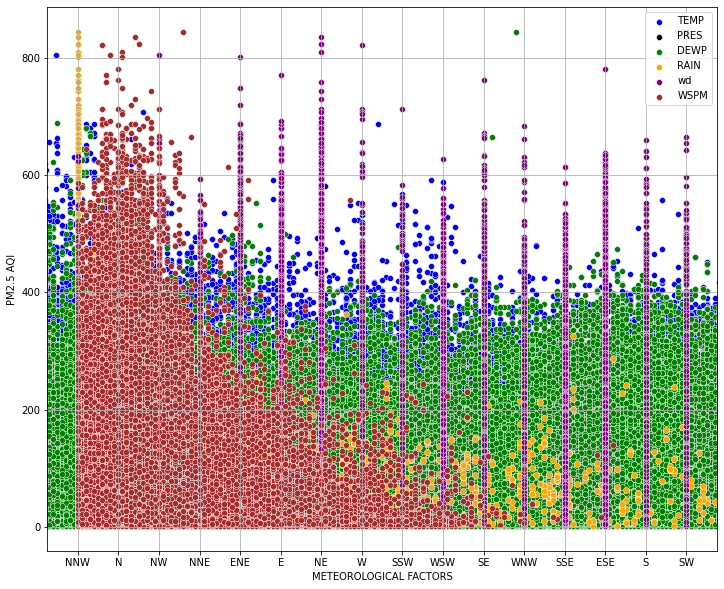

In [ ]:
# create scatter plot for PM2.5 AQI with all meteorological factors
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(x='TEMP', y='PM2.5', ax=ax, label='TEMP', color='blue', data=df)
sns.scatterplot(x='PRES', y='PM2.5', ax=ax, label='PRES', color='black', data=df)
sns.scatterplot(x='DEWP', y='PM2.5', ax=ax, label='DEWP', color='green', data=df)
sns.scatterplot(x='RAIN', y='PM2.5', ax=ax, label='RAIN', color='orange', data=df)
sns.scatterplot(x='wd', y='PM2.5', ax=ax, label='wd', color='purple', data=df)
sns.scatterplot(x='WSPM', y='PM2.5', ax=ax, label='WSPM', color='brown', data=df)

# set axis labels and grid
ax.set_xlabel('METEOROLOGICAL FACTORS')
ax.set_ylabel('PM2.5 AQI')
ax.grid(True)

# add legend
ax.legend()

# save and show plot
plt.savefig('pm25_meteorology', dpi=800)
plt.show()

C:\Users\5540\AppData\Local\Temp/ipykernel_12444/2415644460.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('pm10_meteorology', dpi=800)
C:\Users\5540\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


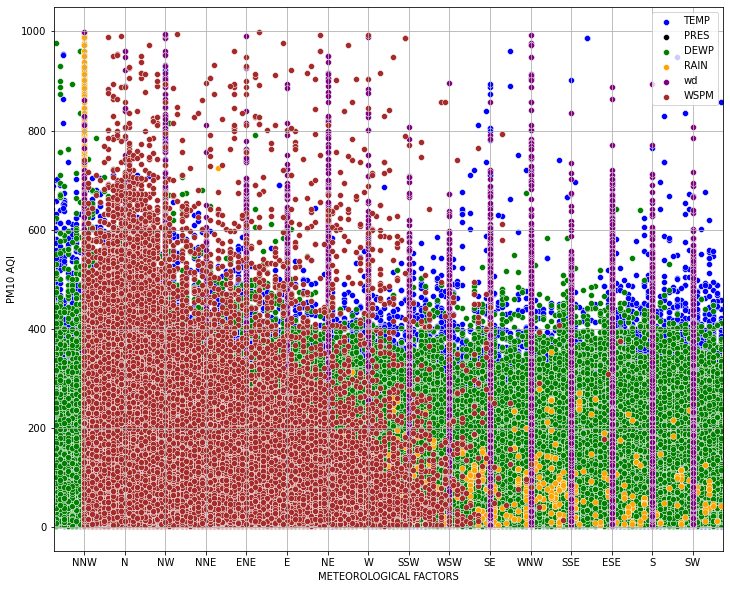

In [ ]:
# create scatter plot for PM10 AQI with all meteorological factors
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(x='TEMP', y='PM10', ax=ax, label='TEMP', color='blue', data=df)
sns.scatterplot(x='PRES', y='PM10', ax=ax, label='PRES', color='black', data=df)
sns.scatterplot(x='DEWP', y='PM10', ax=ax, label='DEWP', color='green', data=df)
sns.scatterplot(x='RAIN', y='PM10', ax=ax, label='RAIN', color='orange', data=df)
sns.scatterplot(x='wd', y='PM10', ax=ax, label='wd', color='purple', data=df)
sns.scatterplot(x='WSPM', y='PM10', ax=ax, label='WSPM', color='brown', data=df)

# set axis labels and grid
ax.set_xlabel('METEOROLOGICAL FACTORS')
ax.set_ylabel('PM10 AQI')
ax.grid(True)

# add legend
ax.legend()

# save and show plot
plt.savefig('pm10_meteorology', dpi=800)
plt.show()

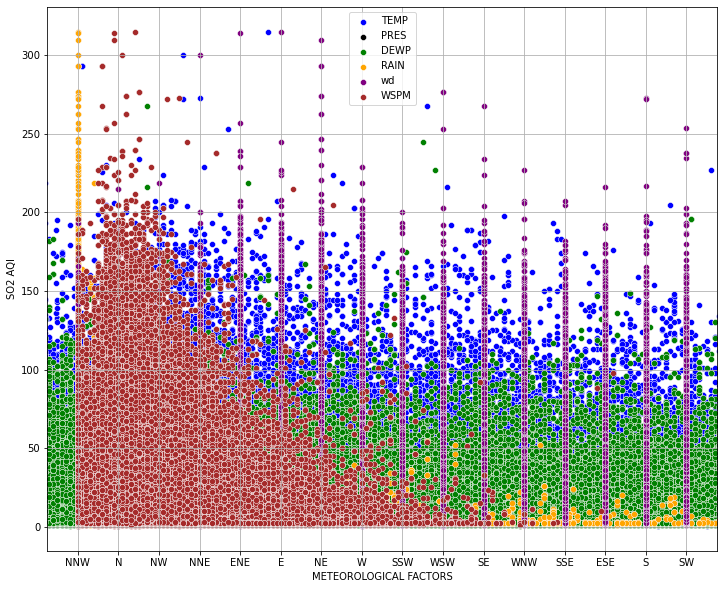

In [ ]:
# create scatter plot for SO2 AQI with all meteorological factors
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(x='TEMP', y='SO2', ax=ax, label='TEMP', color='blue', data=df)
sns.scatterplot(x='PRES', y='SO2', ax=ax, label='PRES', color='black', data=df)
sns.scatterplot(x='DEWP', y='SO2', ax=ax, label='DEWP', color='green', data=df)
sns.scatterplot(x='RAIN', y='SO2', ax=ax, label='RAIN', color='orange', data=df)
sns.scatterplot(x='wd', y='SO2', ax=ax, label='wd', color='purple', data=df)
sns.scatterplot(x='WSPM', y='SO2', ax=ax, label='WSPM', color='brown', data=df)

# set axis labels and grid
ax.set_xlabel('METEOROLOGICAL FACTORS')
ax.set_ylabel('SO2 AQI')
ax.grid(True)

# add legend
ax.legend()

# save and show plot
plt.savefig('SO2_meteorology', dpi=800)
plt.show()

C:\Users\5540\AppData\Local\Temp/ipykernel_12444/955952894.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('NO2_meteorology', dpi=800)
C:\Users\5540\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


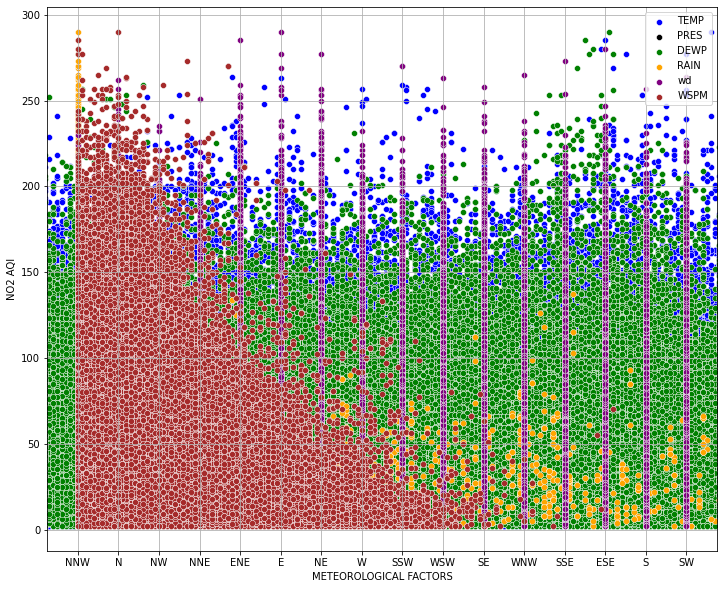

In [ ]:
# create scatter plot for NO2 AQI with all meteorological factors
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(x='TEMP', y='NO2', ax=ax, label='TEMP', color='blue', data=df)
sns.scatterplot(x='PRES', y='NO2', ax=ax, label='PRES', color='black', data=df)
sns.scatterplot(x='DEWP', y='NO2', ax=ax, label='DEWP', color='green', data=df)
sns.scatterplot(x='RAIN', y='NO2', ax=ax, label='RAIN', color='orange', data=df)
sns.scatterplot(x='wd', y='NO2', ax=ax, label='wd', color='purple', data=df)
sns.scatterplot(x='WSPM', y='NO2', ax=ax, label='WSPM', color='brown', data=df)

# set axis labels and grid
ax.set_xlabel('METEOROLOGICAL FACTORS')
ax.set_ylabel('NO2 AQI')
ax.grid(True)

# add legend
ax.legend()

# save and show plot
plt.savefig('NO2_meteorology', dpi=800)
plt.show()

C:\Users\5540\AppData\Local\Temp/ipykernel_12444/502663598.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('CO_meteorology', dpi=800)
C:\Users\5540\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


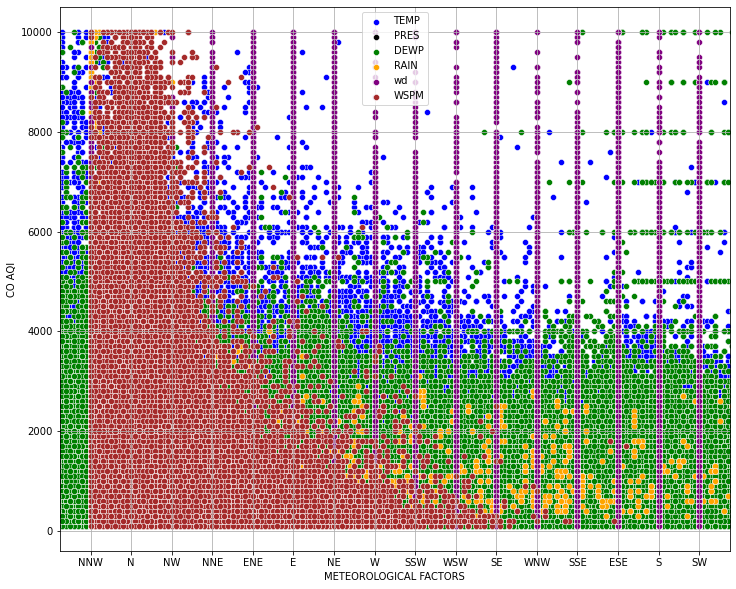

In [ ]:
# create scatter plot for CO AQI with all meteorological factors
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(x='TEMP', y='CO', ax=ax, label='TEMP', color='blue', data=df)
sns.scatterplot(x='PRES', y='CO', ax=ax, label='PRES', color='black', data=df)
sns.scatterplot(x='DEWP', y='CO', ax=ax, label='DEWP', color='green', data=df)
sns.scatterplot(x='RAIN', y='CO', ax=ax, label='RAIN', color='orange', data=df)
sns.scatterplot(x='wd', y='CO', ax=ax, label='wd', color='purple', data=df)
sns.scatterplot(x='WSPM', y='CO', ax=ax, label='WSPM', color='brown', data=df)

# set axis labels and grid
ax.set_xlabel('METEOROLOGICAL FACTORS')
ax.set_ylabel('CO AQI')
ax.grid(True)

# add legend
ax.legend()

# save and show plot
plt.savefig('CO_meteorology', dpi=800)
plt.show()

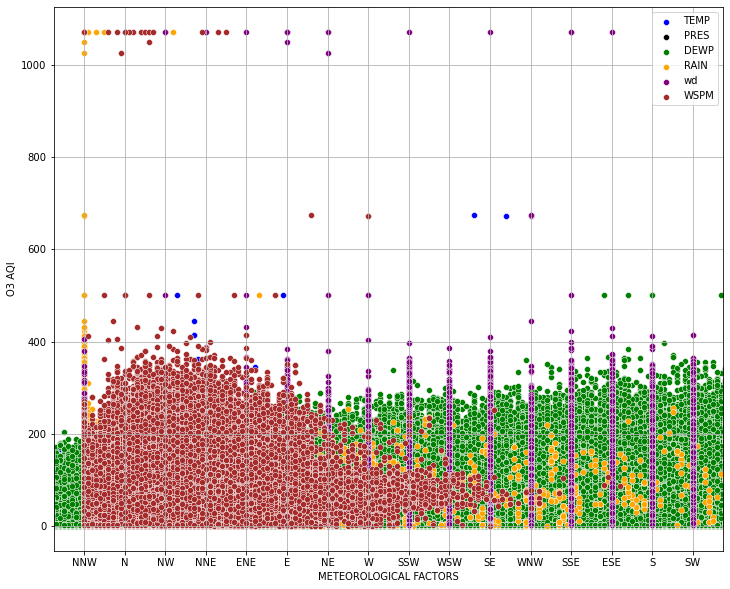

In [ ]:
# create scatter plot for O3 AQI with all meteorological factors
fig, ax = plt.subplots(figsize=(12, 10))
sns.scatterplot(x='TEMP', y='O3', ax=ax, label='TEMP', color='blue', data=df)
sns.scatterplot(x='PRES', y='O3', ax=ax, label='PRES', color='black', data=df)
sns.scatterplot(x='DEWP', y='O3', ax=ax, label='DEWP', color='green', data=df)
sns.scatterplot(x='RAIN', y='O3', ax=ax, label='RAIN', color='orange', data=df)
sns.scatterplot(x='wd', y='O3', ax=ax, label='wd', color='purple', data=df)
sns.scatterplot(x='WSPM', y='O3', ax=ax, label='WSPM', color='brown', data=df)

# set axis labels and grid
ax.set_xlabel('METEOROLOGICAL FACTORS')
ax.set_ylabel('O3 AQI')
ax.grid(True)

# add legend
ax.legend()

# save and show plot
plt.savefig('O3_meteorology', dpi=800)
plt.show()

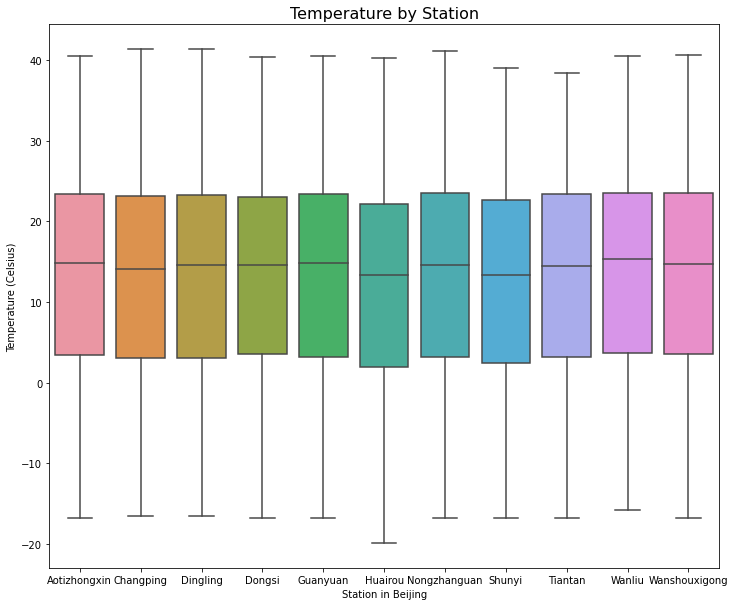

In [ ]:
#set plot figure size
plt.figure(figsize=(12, 10))

# create boxplot of temperature by station
sns.boxplot(x='station', y='TEMP', data=df)

# add titles and axes labels
plt.title('Temperature by Station', fontsize=16)
plt.xlabel('Station in Beijing')
plt.ylabel('Temperature (Celsius)')

# save and show plot
plt.savefig('Temp_station', dpi=800)
plt.show()

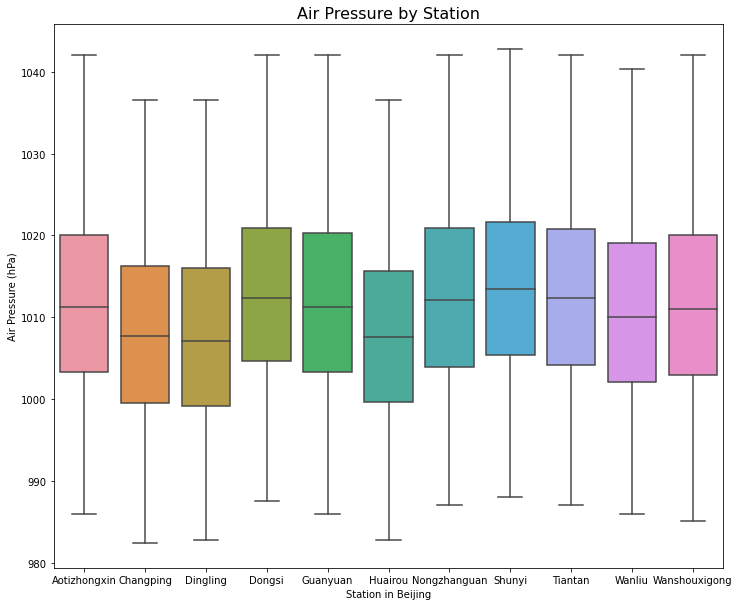

In [ ]:
#set plot figure size
plt.figure(figsize=(12, 10))

# create boxplot of air pressure by station
sns.boxplot(x='station', y='PRES', data=df)

# add titles and axes labels
plt.title('Air Pressure by Station', fontsize=16)
plt.xlabel('Station in Beijing')
plt.ylabel('Air Pressure (hPa)')

# save and show plot
plt.savefig('Pres_station', dpi=800)
plt.show()

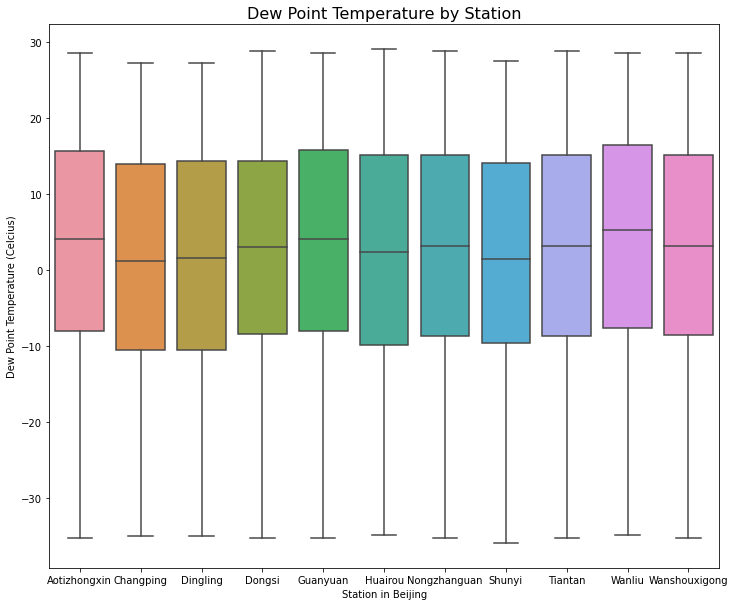

In [ ]:
#set plot figure size
plt.figure(figsize=(12, 10))

# create boxplot of dew point temperature by station
sns.boxplot(x='station', y='DEWP', data=df)

# add titles and axes labels
plt.title('Dew Point Temperature by Station', fontsize=16)
plt.xlabel('Station in Beijing')
plt.ylabel('Dew Point Temperature (Celcius)')

# save and show plot
plt.savefig('Dewp_station', dpi=800)
plt.show()

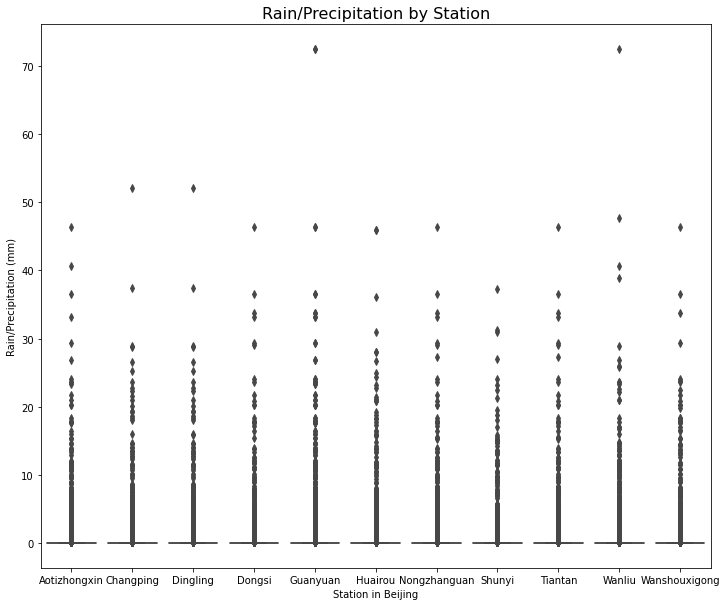

In [ ]:
#set plot figure size
plt.figure(figsize=(12, 10))

# create boxplot of rain (precipitation) by station
sns.boxplot(x='station', y='RAIN', data=df)

# add titles and axes labels
plt.title('Rain/Precipitation by Station', fontsize=16)
plt.xlabel('Station in Beijing')
plt.ylabel('Rain/Precipitation (mm)')

# save and show plot
plt.savefig('Rain_station', dpi=800)
plt.show()

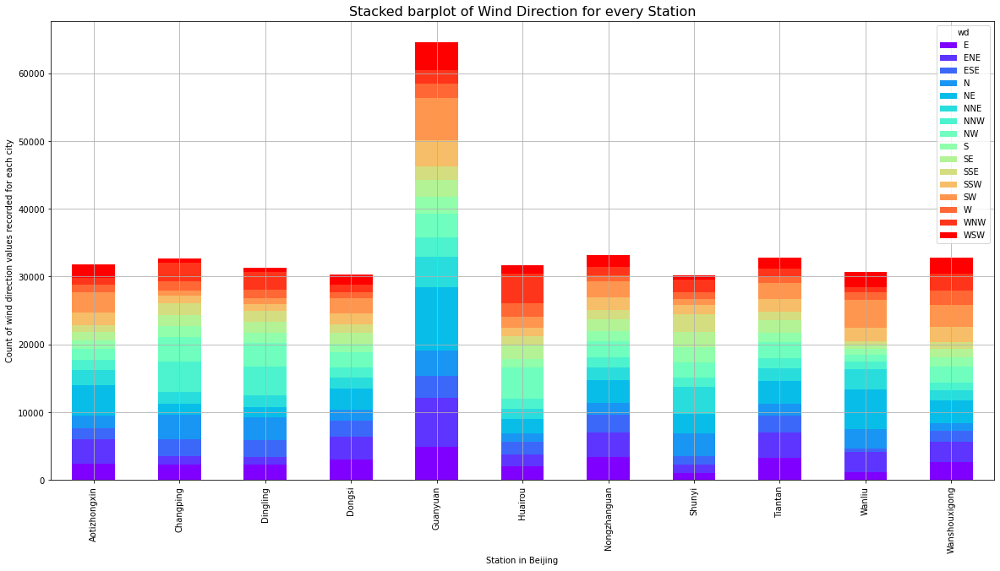

In [ ]:
# create countplot of wind direction vs station
wd_cluster = df.groupby(['station', 'wd']).size()
wd_cluster.unstack().plot(kind='bar',stacked=True, colormap= 'rainbow', figsize=(20,10),  grid=True)

# add titles and axes labels
plt.title('Stacked barplot of Wind Direction for every Station', fontsize=16)
plt.xlabel('Station in Beijing')
plt.ylabel('Count of wind direction values recorded for each city')

# save and show plot
plt.savefig('Wd_station', dpi=800)
plt.show()

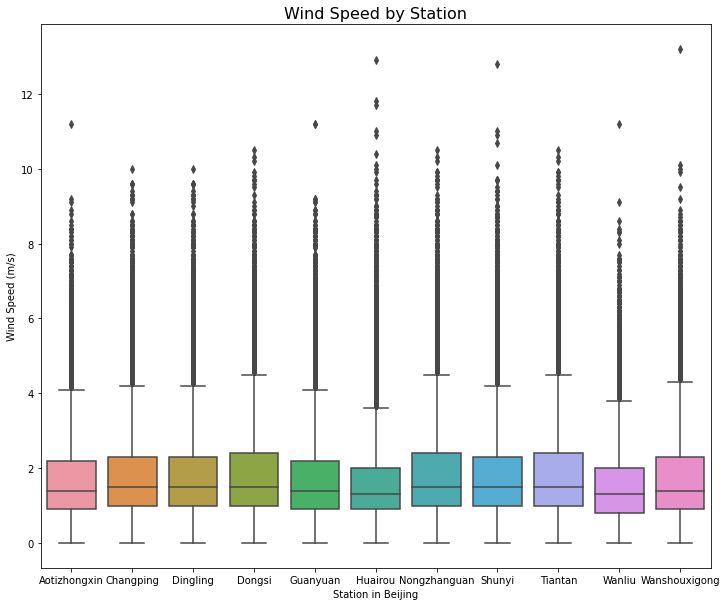

In [ ]:
#set plot figure size
plt.figure(figsize=(12, 10))

# create boxplot of wind speed by station
sns.boxplot(x='station', y='WSPM', data=df)

# add titles and axes labels
plt.title('Wind Speed by Station', fontsize=16)
plt.xlabel('Station in Beijing')
plt.ylabel('Wind Speed (m/s)')

# save and show plot
plt.savefig('Wspm_station', dpi=800)
plt.show()

In [ ]:
# Ao = pd.read_csv("./PRSA_Data/Aotizhongxin.csv")
# Ch = pd.read_csv("./PRSA_Data/Changping.csv")
# Di = pd.read_csv("./PRSA_Data/Dingling.csv")
# Do = pd.read_csv("./PRSA_Data/Dongsi.csv")
# Ga = pd.read_csv("./PRSA_Data/Guanyuan.csv")
# Gc = pd.read_csv("./PRSA_Data/Gucheng.csv")
# Hu = pd.read_csv("./PRSA_Data/Huairou.csv")
# No = pd.read_csv("./PRSA_Data/Nongzhanguan.csv")
# Sh = pd.read_csv("./PRSA_Data/Shunyi.csv")
# Ti = pd.read_csv("./PRSA_Data/Tiantan.csv")
# Wa = pd.read_csv("./PRSA_Data/Wanliu.csv")
# Ws = pd.read_csv("./PRSA_Data/Wanshouxigong.csv")

# MODELING

**We decided to model two (2) stations selected on the basis of stations with least missing data**

In [ ]:
# Accessing station data
all_stations = [Ao, Ch, Di, Do, Ga, Gc, Hu, No, Sh, Ti, Wa, Ws]
for station in all_stations:
    print(f'{station.station[0]}:\n----------------')
    print(station.info())
    print('\n\n')

Aotizhongxin:
----------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34139 non-null  float64
 6   PM10     34346 non-null  float64
 7   SO2      34129 non-null  float64
 8   NO2      34041 non-null  float64
 9   CO       33288 non-null  float64
 10  O3       33345 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None



Changping:
----------------
<

## Selecting Two stations with minimum missing values

In [ ]:
# Checking how many rows contain missing data for each station data
missing_val_counts = list()
stations = {}
for station in all_stations:
    missing_counts = station.isna().sum().sum()
    missing_val_counts.append(missing_counts)

    stations[missing_counts] = station.station[0]

    print(f'{station.station[0]}: ', end='\t')
    print(f'No of Missing values: {missing_counts}')
    # print('\n')

# Selecting 2 stations with the least missing values
missing_val_counts.sort()

print('\nSelected Stations with Minimum missing values')
print('---------------------------------------------\n')
print(f'{stations[missing_val_counts[0]]}: {missing_val_counts[0]}')
print(f'{stations[missing_val_counts[1]]}: {missing_val_counts[1]}')


Aotizhongxin: 	No of Missing values: 7271
Changping: 	No of Missing values: 5166
Dingling: 	No of Missing values: 7015
Dongsi: 	No of Missing values: 7600
Guanyuan: 	No of Missing values: 5279
Gucheng: 	No of Missing values: 4728
Huairou: 	No of Missing values: 7485
Nongzhanguan: 	No of Missing values: 4090
Shunyi: 	No of Missing values: 8523
Tiantan: 	No of Missing values: 5277
Wanliu: 	No of Missing values: 6447
Wanshouxigong: 	No of Missing values: 5146

Selected Stations with Minimum missing values
---------------------------------------------

Nongzhanguan: 4090
Gucheng: 4728


**Selected Stations are:**
- Nongzhanguan: 4090
- Gucheng: 4728

# PREPROCESSING FOR MODELING

## Re-encoding Series for both stations to have time-series datetime

In [8]:
def reorganize_dataset(df):
    # Resetting index into datetime series
    df['datetime'] = datetime = df.year.apply(str) + '-' + df.month.apply(str) + '-' + df.day.apply(str) + ' ' + df.hour.apply(str) + ':00'
    df.datetime = pd.to_datetime(df.datetime)
    df = df.set_index('datetime', drop=True)
    df.head()

    # Dropping columns we won't use at the moment
    df.drop(columns=['No', 'year', 'month', 'day', 'hour', 'station'], inplace=True)
    df.head()

    # Re-arranging dataset columns to have a visual representations of features before Targets
    return pd.concat([ df[df.columns[-6:]], df[df.columns[:6]] ], axis='columns')

In [9]:
def visualize_features_series(df,  hours=24*31*6, index=-1):
    colors = ['black', 'red', 'blue', 'green', 'gray', 'orange']
    sub_df = df[['TEMP','PRES','DEWP','RAIN','wd','WSPM']]
    
    if index < 0 and hours <= len(sub_df):   # if index is negative, select last 'hours' series
        sub_df = sub_df.iloc[-hours:]
    elif index > 0 and hours <= len(sub_df): # otherwise, select first 'hours' series data
        sub_df = sub_df.iloc[:-hours]

    plt.figure(figsize=(16, 8), dpi=150)
    fig, ax = plt.subplots(len(sub_df.columns), sharex=True)

    for i, col in enumerate(sub_df):
        ax[i].plot(sub_df[col], label=col, color=colors[i])
        ax[i].set_title(col)
    fig.tight_layout()



def visualize_pollutants_series(df, hours=24*31*6, index=-1):
    colors = ['black', 'red', 'blue', 'green', 'gray', 'orange']
    sub_df = df.iloc[:, -6:]

    if index < 0 and hours <= len(sub_df):   # if index is negative, select last 'hours' series
        sub_df = sub_df.iloc[-hours:]
    elif index > 0 and hours <= len(sub_df): # otherwise, select first 'hours' series data
        sub_df = sub_df.iloc[:-hours]

    plt.figure(figsize=(16, 8), dpi=150)
    fig, ax = plt.subplots(len(sub_df.columns), sharex=True)

    for i, col in enumerate(sub_df):
        ax[i].plot(sub_df[col], label=col, color=colors[i])
        ax[i].set_title(col)
    fig.tight_layout()

In [10]:
# from statsmodels.tsa.stattools import adfuller
def test_for_stationarity_single(series_data=None):
    results = adfuller(series_data.dropna())
    print('p-value: %f' % results[1])    
    if results[1] < 0.05:  # if p value is less than 0.05, it is assumed to be stationary
        print('Series is stationary')
    else:
        print('Series is not stationary')


def visualize_series_single(series_data=None, days=None, title='PM2.5 Pollutant AQI'):
    if series_data is not None:
        if days is None:
            series_data.plot(title=title)
        elif days > len(series_data) * 24:
            series_data.plot(title=title)
        else:
            series_data[-24 * days:].plot(title=title)



# from statsmodels.tsa.seasonal import seasonal_decompose
def decompose_series_single(series_data=None, model='additive', period=24):
    """
      model: {'additive' | 'multiplicative'}. 
          NOTE: 
            Use 'additive' if seasonal variation are relatively constant over time. i.e. linear.
            Use 'multiplicative' if the trend and seasonal variation increase or decrease over time.
    """

    if series_data is not None:
        results=seasonal_decompose(series_data, model=model, period=period)
        results.plot()
        return results


def series_to_supervised_dataset_single(series_data, n_lags=24):
    dataframe = pd.DataFrame()
    for i in range(n_lags, 0, -1):
        dataframe[f"{series_data.name.replace('.', '')}t-{i}"] = series_data.shift(i)
    final_data = pd.concat([dataframe, series_data], axis=1)
    final_data.dropna(inplace=True)
    return final_data


# using last 1 month as default for testing set
def split_train_test_series_single(df, test_size=24*31): 
    train, test = df.iloc[:-test_size], df.iloc[-test_size:]
    X_train, y_train = train[:, :-1], train[:,-1]
    X_test, y_test = test[:, :-1], test[:,-1]

    return (X_train, y_train, X_test, y_test)
  
def predict_series_single(testX_df, model): # two weeks
    predictions = list()

    # get the first row
    Xt = testX_df.iloc[0].values.reshape(1,-1)
    for i in range(1, len(testX_df)):
        yhat = model.predict(Xt)
        predictions.append(yhat)
        Xt = Xt[1:]



In [11]:
# Re-organizing datasets for the two (2) stations into a form good for modeling
No = reorganize_dataset(No)  # Nongzhanguan station
Gc = reorganize_dataset(Gc)  # Gucheng station

# Nongzhanguan station Series Data

In [ ]:
No.head(3)

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,-0.5,1024.5,-21.4,0.0,NNW,5.7,5.0,14.0,4.0,12.0,200.0,85.0
2013-03-01 01:00:00,-0.7,1025.1,-22.1,0.0,NW,3.9,8.0,12.0,6.0,14.0,200.0,84.0
2013-03-01 02:00:00,-1.2,1025.3,-24.6,0.0,NNW,5.3,3.0,6.0,5.0,14.0,200.0,83.0


In [ ]:
No.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35064 entries, 2013-03-01 00:00:00 to 2017-02-28 23:00:00
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   TEMP    35044 non-null  float64
 1   PRES    35044 non-null  float64
 2   DEWP    35044 non-null  float64
 3   RAIN    35044 non-null  float64
 4   wd      34986 non-null  object 
 5   WSPM    35050 non-null  float64
 6   PM2.5   34436 non-null  float64
 7   PM10    34624 non-null  float64
 8   SO2     34618 non-null  float64
 9   NO2     34372 non-null  float64
 10  CO      33858 non-null  float64
 11  O3      34558 non-null  float64
dtypes: float64(11), object(1)
memory usage: 3.5+ MB


In [ ]:
# Missing values
No.isna().sum()

TEMP       20
PRES       20
DEWP       20
RAIN       20
wd         78
WSPM       14
PM2.5     628
PM10      440
SO2       446
NO2       692
CO       1206
O3        506
dtype: int64

### Treating Missing values

We replace missing data by Imputing with linear (being linear time series) interpolation to fill missing values with an increasing order between the previous and next non-null observed values. It is important to note that this function threats values as equally spaced.
 
linear_interpolation = df.interpolate(method='linear')

In [12]:
# Treating Missing values
No = No.interpolate(method='linear')
No.isna().sum()

TEMP      0
PRES      0
DEWP      0
RAIN      0
wd       78
WSPM      0
PM2.5     0
PM10      0
SO2       0
NO2       0
CO        0
O3        0
dtype: int64

**All the numeric columns have been cleaned for numeric columns have been cleaned**

However, wd (Wind Direction) which is a categorical column still have about 78 missing values, which we will fill after encoding the categorical series into its numeric form. 

We will be filling the missing values of the series by imputing with the previously observed value, we are using method=“bfill”. We are using bfill because current value depends on the previous one.

In [13]:
No.wd = No.wd.fillna(method='bfill')
No.isna().sum()

TEMP     0
PRES     0
DEWP     0
RAIN     0
wd       0
WSPM     0
PM2.5    0
PM10     0
SO2      0
NO2      0
CO       0
O3       0
dtype: int64

**No more missing data for the first station data**

In [ ]:
No.head()

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,-0.5,1024.5,-21.4,0.0,NNW,5.7,5.0,14.0,4.0,12.0,200.0,85.0
2013-03-01 01:00:00,-0.7,1025.1,-22.1,0.0,NW,3.9,8.0,12.0,6.0,14.0,200.0,84.0
2013-03-01 02:00:00,-1.2,1025.3,-24.6,0.0,NNW,5.3,3.0,6.0,5.0,14.0,200.0,83.0
2013-03-01 03:00:00,-1.4,1026.2,-25.5,0.0,N,4.9,5.0,5.0,5.0,14.0,200.0,84.0
2013-03-01 04:00:00,-1.9,1027.1,-24.5,0.0,NNW,3.2,5.0,5.0,6.0,21.0,200.0,77.0


#### Encoding Categorical Variables

In [ ]:
# Accessing data values to discover Categorical Variables

for col in No.columns[:6]:
    print(f'{col}:\n-------')
    print(No[col].unique())
    print('\n\n')
    

TEMP:
-------
[-5.00000000e-01 -7.00000000e-01 -1.20000000e+00 -1.40000000e+00
 -1.90000000e+00 -2.40000000e+00 -2.50000000e+00 -3.00000000e-01
  4.00000000e-01  1.40000000e+00  2.90000000e+00  4.00000000e+00
  5.00000000e+00  6.20000000e+00  6.00000000e+00  5.60000000e+00
  4.40000000e+00  3.20000000e+00  3.00000000e+00  1.60000000e+00
  8.00000000e-01  1.00000000e-01 -1.60000000e+00 -2.20000000e+00
 -3.10000000e+00 -2.30000000e+00 -9.00000000e-01  1.50000000e+00
  2.60000000e+00  3.80000000e+00  3.90000000e+00  4.30000000e+00
  4.10000000e+00  2.20000000e+00  7.00000000e-01  5.00000000e-01
 -1.00000000e+00 -1.30000000e+00 -1.80000000e+00 -3.30000000e+00
 -4.20000000e+00 -5.20000000e+00 -5.40000000e+00  1.20000000e+00
  6.80000000e+00  9.50000000e+00  1.34000000e+01  1.55000000e+01
  1.64000000e+01  1.66000000e+01  1.58000000e+01  1.26000000e+01
  9.90000000e+00  5.20000000e+00  2.70000000e+00  7.10000000e+00
  9.30000000e+00  8.40000000e+00  7.40000000e+00  4.20000000e+00
  7.2000000

**'wd' is the only categorical variable discovered.**

## Encoding the 'wd' (Wind Direction) categorical variable 

using the same approach as [Bekka et al., 2021](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-021-00548-1)

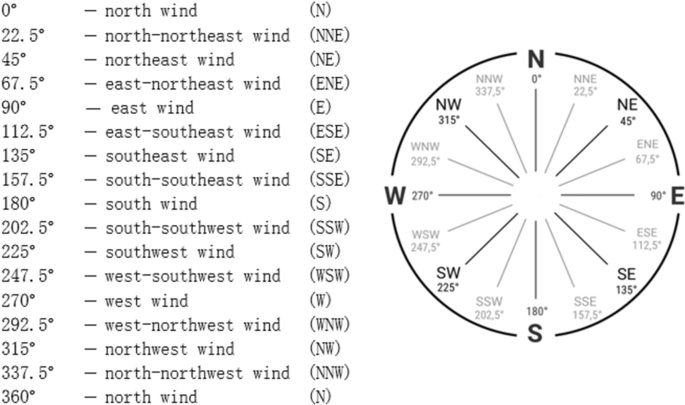

In [ ]:
No.wd.unique()

array(['NNW', 'NW', 'N', 'W', 'ENE', 'NE', 'E', 'NNE', 'SW', 'SSW', 'S',
       'WSW', 'ESE', 'SE', 'WNW', 'SSE'], dtype=object)

In [14]:
encoder = {
    'N':0.0, 'NNE':22.5, 'NE':45, 'ENE':67.5, 
    'E':90, 'ESE':112.5, 'SE':135, 'SSE':157.5, 
    'S':180, 'SSW':202.5, 'SW':225, 'WSW':247.5,
    'W':270, 'WNW':292.5, 'NW':315, 'NNW':337.5,
    'N':360
}

No.wd = No.wd.map(encoder)

No.head()

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,-0.5,1024.5,-21.4,0.0,337.5,5.7,5.0,14.0,4.0,12.0,200.0,85.0
2013-03-01 01:00:00,-0.7,1025.1,-22.1,0.0,315.0,3.9,8.0,12.0,6.0,14.0,200.0,84.0
2013-03-01 02:00:00,-1.2,1025.3,-24.6,0.0,337.5,5.3,3.0,6.0,5.0,14.0,200.0,83.0
2013-03-01 03:00:00,-1.4,1026.2,-25.5,0.0,360.0,4.9,5.0,5.0,5.0,14.0,200.0,84.0
2013-03-01 04:00:00,-1.9,1027.1,-24.5,0.0,337.5,3.2,5.0,5.0,6.0,21.0,200.0,77.0


### Visualizing Nongzhanguan station series data

<Figure size 2400x1200 with 0 Axes>

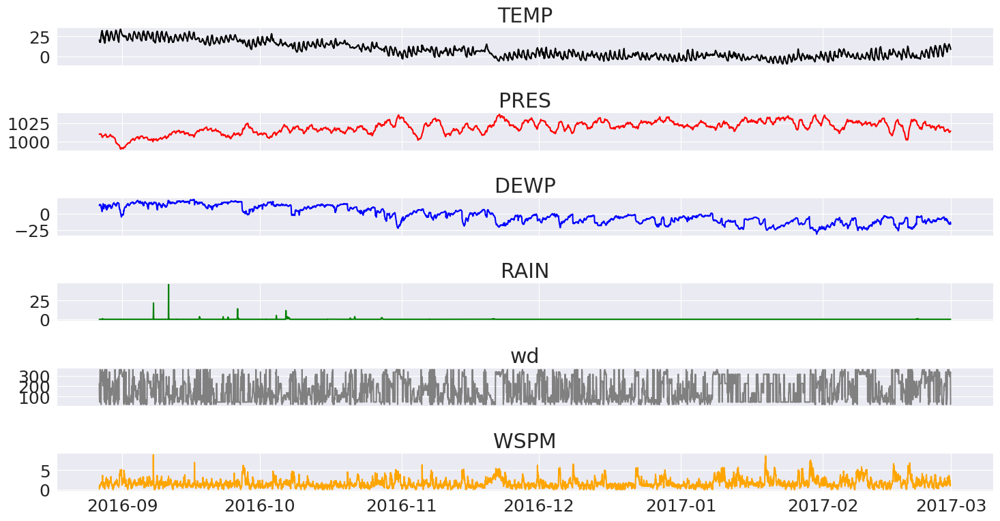

In [ ]:
# Visualizing series (For Feature/Measured Parameters) Last 6 months of series

visualize_features_series(df=No, hours=24*31*6, index=-1) 

<Figure size 2400x1200 with 0 Axes>

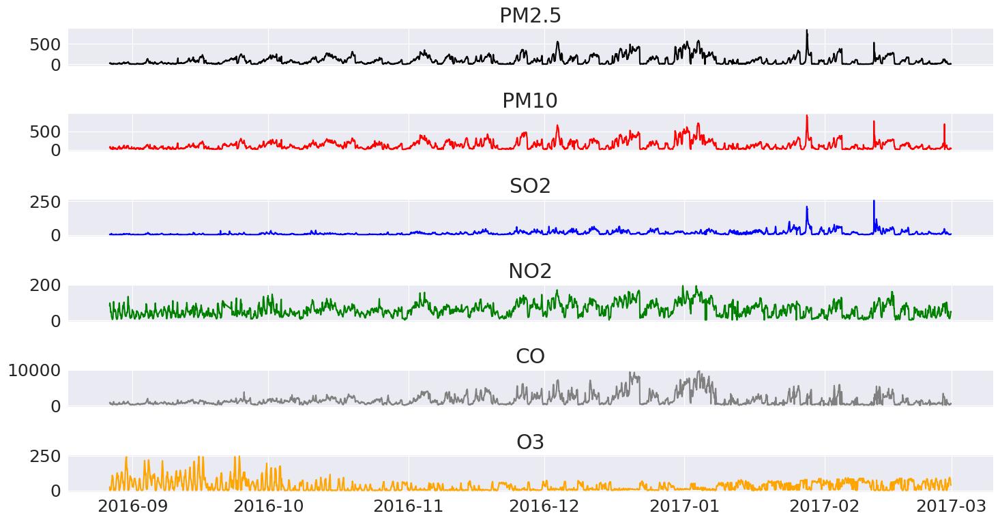

In [ ]:
# Visualizing series (For Pollutants AQI) for Last 6 months of series

visualize_pollutants_series(df=No, hours=24*31*6, index=-1)

In [ ]:
# Saving a copy of the cleaned Nongzhanguan station series data
No.to_csv(f'{CLEANED_DATASET_PATH}/Nongzhanguan_cleaned.csv')

# Gucheng station Series Data

In [ ]:
Gc.head(3)

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,NW,4.4,6.0,18.0,5.0,NaN,800.0,88.0
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,NW,4.0,6.0,15.0,5.0,NaN,800.0,88.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,WNW,4.6,5.0,18.0,NaN,NaN,700.0,52.0


In [ ]:
Gc.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35064 entries, 2013-03-01 00:00:00 to 2017-02-28 23:00:00
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   TEMP    35013 non-null  float64
 1   PRES    35014 non-null  float64
 2   DEWP    35013 non-null  float64
 3   RAIN    35021 non-null  float64
 4   wd      34905 non-null  object 
 5   WSPM    35022 non-null  float64
 6   PM2.5   34418 non-null  float64
 7   PM10    34683 non-null  float64
 8   SO2     34557 non-null  float64
 9   NO2     34396 non-null  float64
 10  CO      33663 non-null  float64
 11  O3      34335 non-null  float64
dtypes: float64(11), object(1)
memory usage: 3.5+ MB


In [15]:
# Missing values
Gc.isna().sum()

TEMP       51
PRES       50
DEWP       51
RAIN       43
wd        159
WSPM       42
PM2.5     646
PM10      381
SO2       507
NO2       668
CO       1401
O3        729
dtype: int64

### Treating Missing values

We replace missing data by Imputing with linear (being linear time series) interpolation to fill missing values with an increasing order between the previous and next non-null observed values. It is important to note that this function threats values as equally spaced.
 
linear_interpolation = df.interpolate(method='linear')

In [16]:
# Treating Missing values
Gc = Gc.interpolate(method='linear')
Gc.isna().sum()

TEMP       0
PRES       0
DEWP       0
RAIN       0
wd       159
WSPM       0
PM2.5      0
PM10       0
SO2        0
NO2       20
CO         0
O3         0
dtype: int64

In [ ]:
Gc[Gc.NO2.isna()]

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,NW,4.4,6.0,18.0,5.0,NaN,800.0,88.0
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,NW,4.0,6.0,15.0,5.0,NaN,800.0,88.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,WNW,4.6,5.0,18.0,5.5,NaN,700.0,52.0
2013-03-01 03:00:00,-1.0,1022.7,-21.2,0.0,W,2.8,6.0,20.0,6.0,NaN,650.0,62.5
2013-03-01 04:00:00,-1.3,1023.0,-21.4,0.0,WNW,3.6,5.0,17.0,5.0,NaN,600.0,73.0
2013-03-01 05:00:00,-1.8,1023.6,-21.9,0.0,E,1.2,4.0,11.0,3.0,NaN,700.0,87.0
2013-03-01 06:00:00,-2.6,1024.3,-20.4,0.0,ENE,1.2,3.0,6.0,3.0,NaN,700.0,92.0
2013-03-01 07:00:00,-0.9,1025.6,-20.5,0.0,ENE,1.1,5.0,5.0,3.0,NaN,800.0,86.0
2013-03-01 08:00:00,0.1,1026.1,-20.3,0.0,ENE,3.0,5.0,9.0,5.0,NaN,900.0,81.0


**All the numeric columns have been cleaned for numeric columns have been cleaned**

However, wd (Wind Direction) which is a categorical column still have about 159 missing values, which we will fill. Also, NO2 has 20 missing values which are consecutive missing data, as such linear interpolation could not work. 

We will be filling the remaining missing values of the series (wd and NO2) by imputing with the previously observed value, we are using method=“bfill”. We are using bfill because current value depends on the previous one.

In [17]:
Gc.wd = Gc.wd.fillna(method='bfill')
Gc.NO2 = Gc.NO2.fillna(method='bfill')
Gc.isna().sum()

TEMP     0
PRES     0
DEWP     0
RAIN     0
wd       0
WSPM     0
PM2.5    0
PM10     0
SO2      0
NO2      0
CO       0
O3       0
dtype: int64

**No more missing data for the second (Gucheng) station**

In [ ]:
Gc.head()

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,NW,4.4,6.0,18.0,5.0,5.0,800.0,88.0
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,NW,4.0,6.0,15.0,5.0,5.0,800.0,88.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,WNW,4.6,5.0,18.0,5.5,5.0,700.0,52.0
2013-03-01 03:00:00,-1.0,1022.7,-21.2,0.0,W,2.8,6.0,20.0,6.0,5.0,650.0,62.5
2013-03-01 04:00:00,-1.3,1023.0,-21.4,0.0,WNW,3.6,5.0,17.0,5.0,5.0,600.0,73.0


#### Encoding Categorical Variables

In [ ]:
# Accessing data values to discover Categorical Variables

for col in Gc.columns[:6]:
    print(f'{col}:\n-------')
    print(Gc[col].unique())
    print('\n\n')
    

TEMP:
-------
[ 0.1        -0.3        -0.7        ...  0.925      -0.475
 -1.46666667]



PRES:
-------
[1021.1        1021.5        1022.7        1023.         1023.6
 1024.3        1025.6        1026.1        1025.1        1024.1
 1023.8        1023.5        1024.2        1025.3        1027.1
 1028.1        1028.4        1028.6        1028.9        1029.2
 1028.8        1028.7        1028.         1027.5        1027.7
 1027.8        1027.2        1026.4        1023.7        1022.9
 1022.3        1021.7        1021.6        1021.2        1020.7
 1020.2        1019.2        1018.4        1017.6        1016.2
 1015.4        1014.9        1014.5        1014.4        1014.7
 1014.1        1013.6        1012.8        1011.7        1010.4
 1009.3        1008.7        1008.3        1008.4        1009.1
 1010.1        1011.3        1011.4        1011.9        1012.7
 1015.8        1016.4        1016.9        1017.9        1018.7
 1018.5        1016.7        1015.7        1014.2        1013.8

**'wd' is the only categorical variable discovered.**

## Encoding the 'wd' (Wind Direction) categorical variable 

using the same approach as [Bekka et al., 2021](https://journalofbigdata.springeropen.com/articles/10.1186/s40537-021-00548-1)

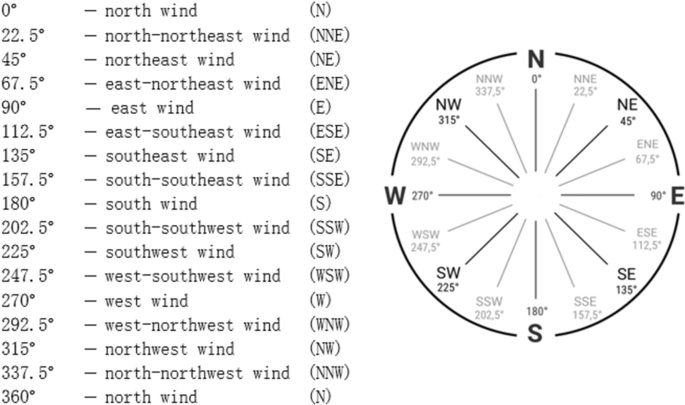

In [ ]:
Gc.wd.unique()

array(['NW', 'WNW', 'W', 'E', 'ENE', 'NE', 'ESE', 'SSE', 'NNE', 'SW',
       'SSW', 'S', 'SE', 'NNW', 'N', 'WSW'], dtype=object)

In [18]:
encoder = {
    'N':0.0, 'NNE':22.5, 'NE':45, 'ENE':67.5, 
    'E':90, 'ESE':112.5, 'SE':135, 'SSE':157.5, 
    'S':180, 'SSW':202.5, 'SW':225, 'WSW':247.5,
    'W':270, 'WNW':292.5, 'NW':315, 'NNW':337.5,
    'N':360
}

Gc.wd = Gc.wd.map(encoder)

Gc.head()

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,315.0,4.4,6.0,18.0,5.0,5.0,800.0,88.0
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,315.0,4.0,6.0,15.0,5.0,5.0,800.0,88.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,292.5,4.6,5.0,18.0,5.5,5.0,700.0,52.0
2013-03-01 03:00:00,-1.0,1022.7,-21.2,0.0,270.0,2.8,6.0,20.0,6.0,5.0,650.0,62.5
2013-03-01 04:00:00,-1.3,1023.0,-21.4,0.0,292.5,3.6,5.0,17.0,5.0,5.0,600.0,73.0


# Visualizing Nongzhanguan station series data

<Figure size 2400x1200 with 0 Axes>

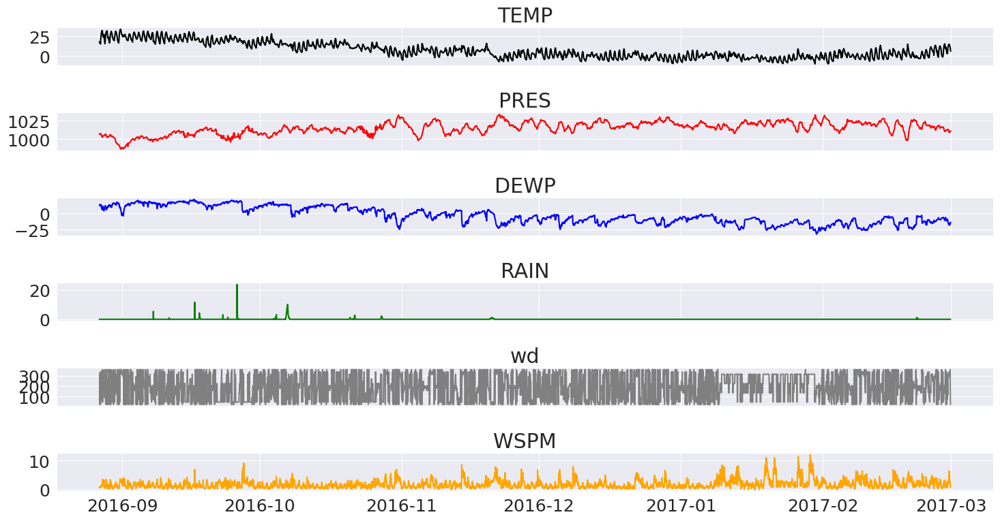

In [ ]:
# Visualizing series (For Feature/Measured Parameters) Last 6 months of series

visualize_features_series(df=Gc, hours=24*31*6, index=-1) 

<Figure size 2400x1200 with 0 Axes>

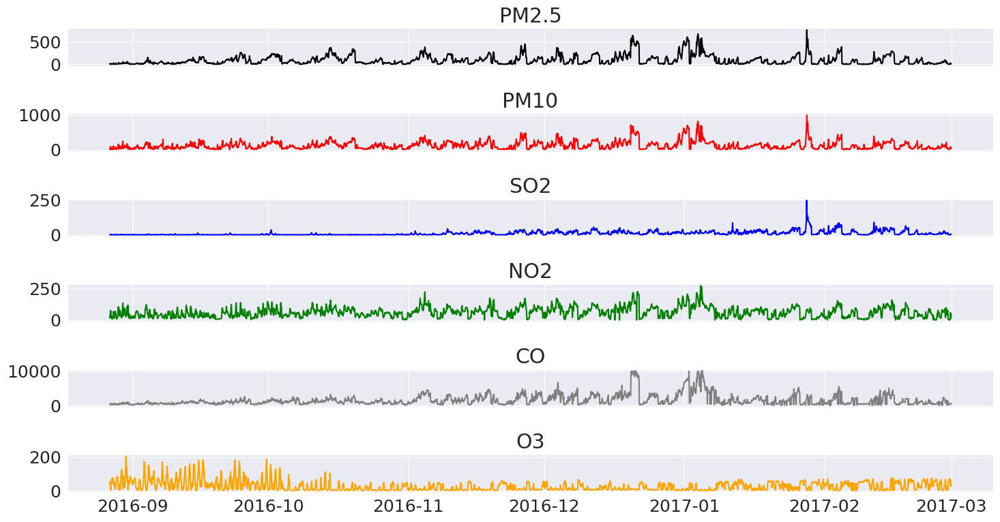

In [ ]:
# Visualizing series (For Pollutants AQI) for Last 6 months of series

visualize_pollutants_series(df=Gc, hours=24*31*6, index=-1)

In [ ]:
# Saving a copy of the cleaned Gucheng station series data
Gc.to_csv(f'{CLEANED_DATASET_PATH}/Gucheng_cleaned.csv')

# Analyzing Nongzhanguan station Pollutants series data

In [ ]:
No.head(3)

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,-0.5,1024.5,-21.4,0.0,337.5,5.7,5.0,14.0,4.0,12.0,200.0,85.0
2013-03-01 01:00:00,-0.7,1025.1,-22.1,0.0,315.0,3.9,8.0,12.0,6.0,14.0,200.0,84.0
2013-03-01 02:00:00,-1.2,1025.3,-24.6,0.0,337.5,5.3,3.0,6.0,5.0,14.0,200.0,83.0


## PM2.5 Series

<Axes: title={'center': 'PM2.5 Series'}, xlabel='datetime'>

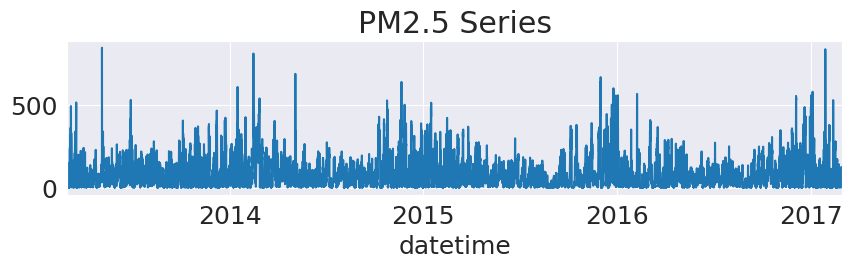

In [ ]:
pm25_data = No['PM2.5']

plt.figure(figsize=(10,2))
pm25_data.plot(title='PM2.5 Series')

<Axes: title={'center': 'PM2.5 Series'}, xlabel='datetime'>

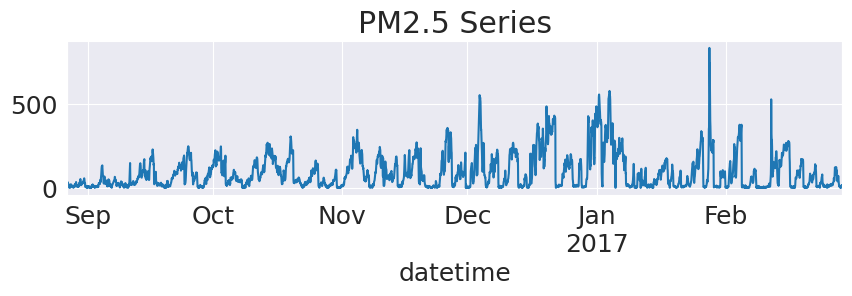

In [ ]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
pm25_data.iloc[-24*31*6:].plot(title='PM2.5 Series')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

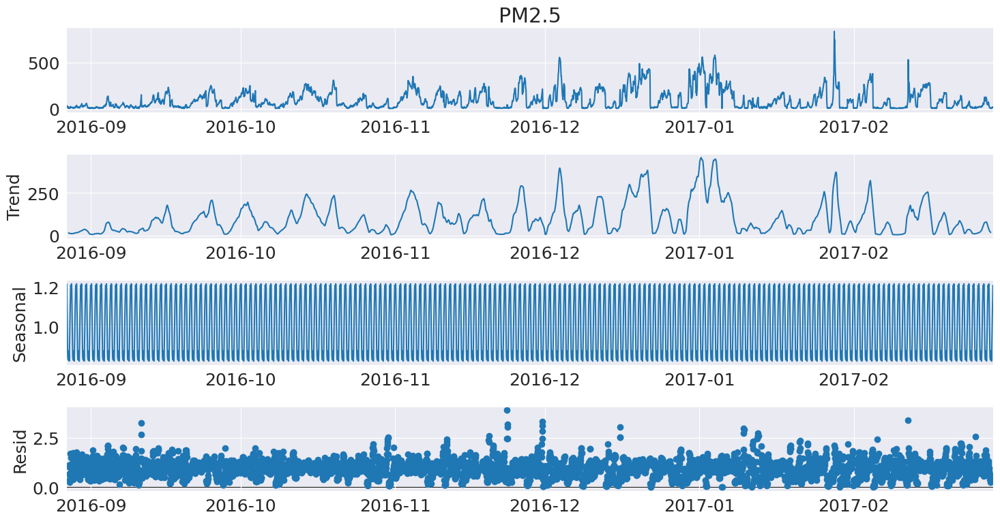

In [ ]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(pm25_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

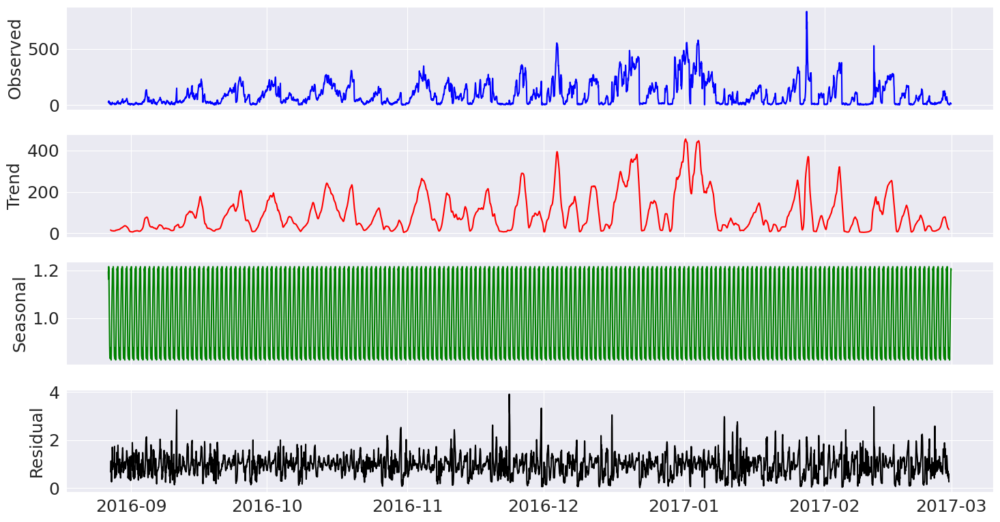

In [ ]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

## Checking whether series is stationary
using adfuler test

In [ ]:
test_for_stationarity_single(pm25_data)

p-value: 0.000000
Series is stationary


<Axes: xlabel='datetime'>

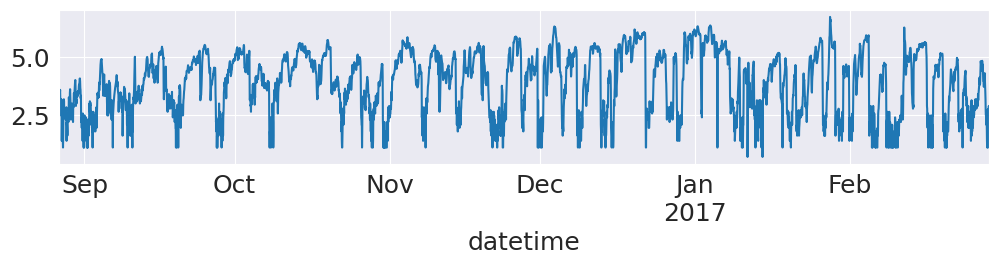

In [ ]:
logged_pm25 = pm25_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_pm25[-24*31*6:].plot()

## PM10 Series

<Axes: title={'center': 'PM10 Series'}, xlabel='datetime'>

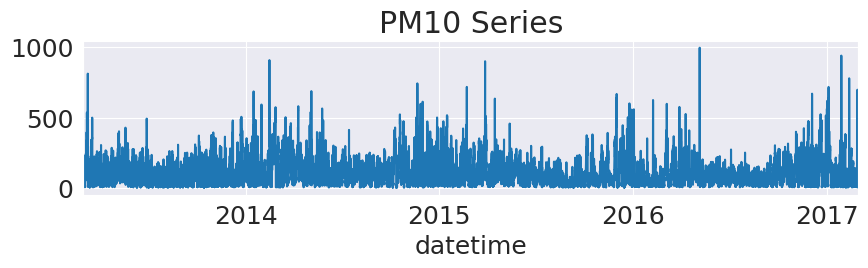

In [19]:
pm10_data = No['PM10']

plt.figure(figsize=(10,2))
pm10_data.plot(title='PM10 Series')

<Axes: title={'center': 'PM10 Series'}, xlabel='datetime'>

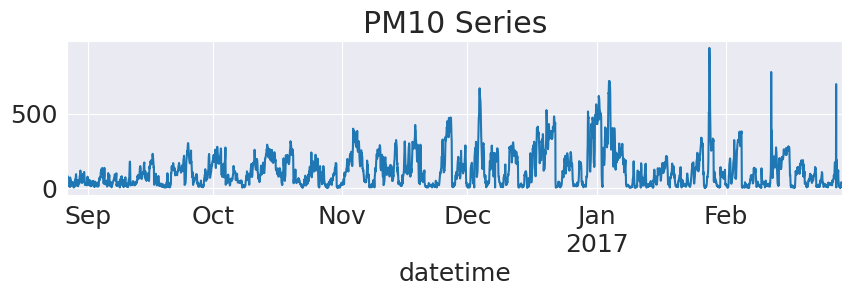

In [20]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
pm10_data.iloc[-24*31*6:].plot(title='PM10 Series')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

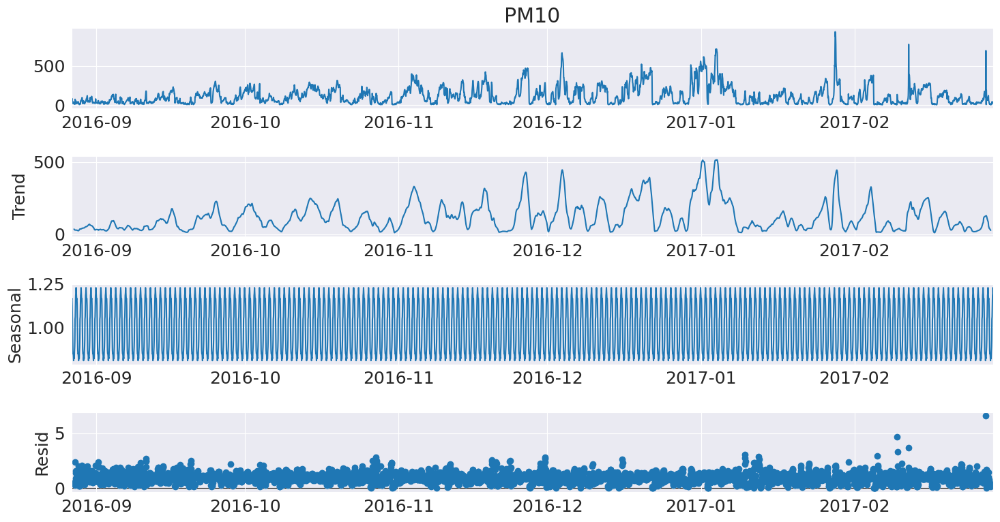

In [21]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(pm10_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

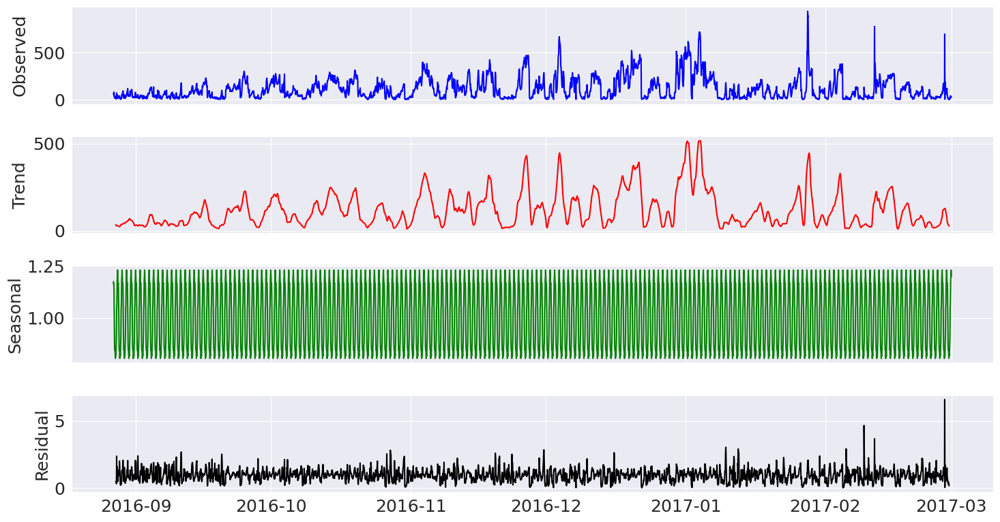

In [22]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [23]:
test_for_stationarity_single(pm10_data)

p-value: 0.000000
Series is stationary


<Axes: xlabel='datetime'>

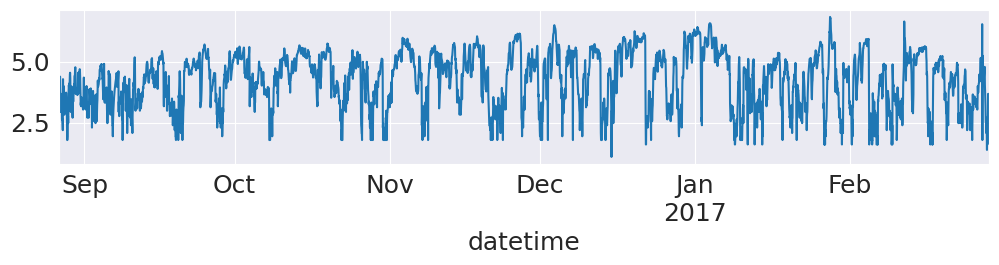

In [24]:
logged_pm10 = pm10_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_pm10[-24*31*6:].plot()

## SO2 Series

<Axes: title={'center': 'SO2 Series'}, xlabel='datetime'>

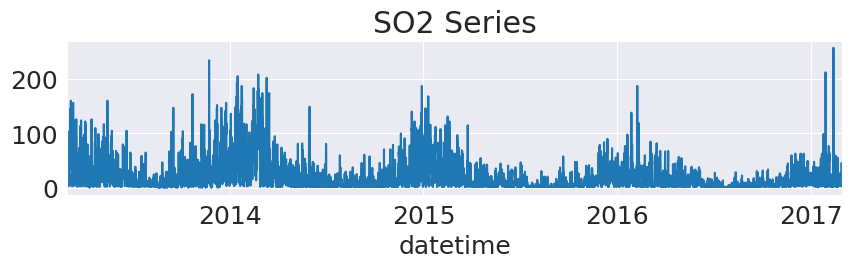

In [26]:
so2_data = No['SO2']

plt.figure(figsize=(10,2))
so2_data.plot(title='SO2 Series')

<Axes: title={'center': 'SO2 Series'}, xlabel='datetime'>

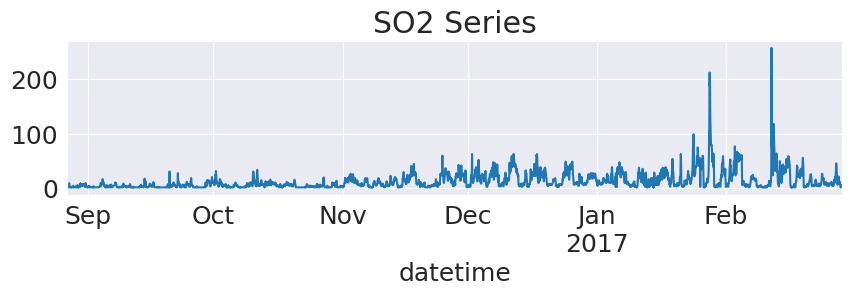

In [27]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
so2_data.iloc[-24*31*6:].plot(title='SO2 Series')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

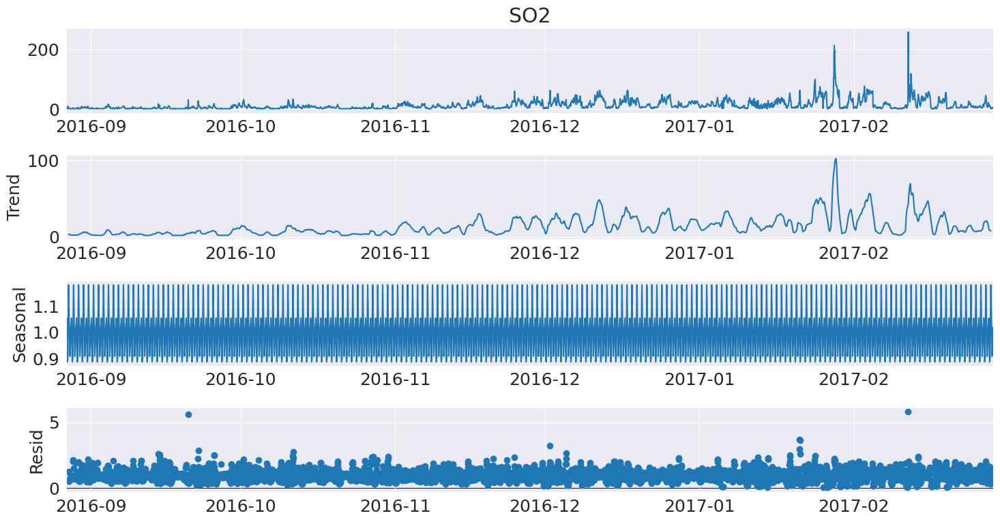

In [28]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(so2_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

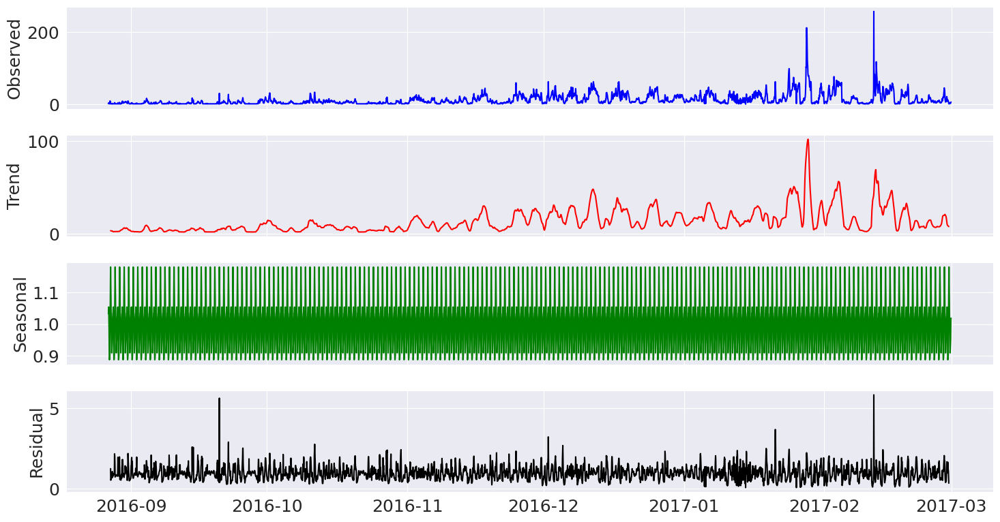

In [29]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [30]:
test_for_stationarity_single(so2_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'SO2'}, xlabel='datetime'>

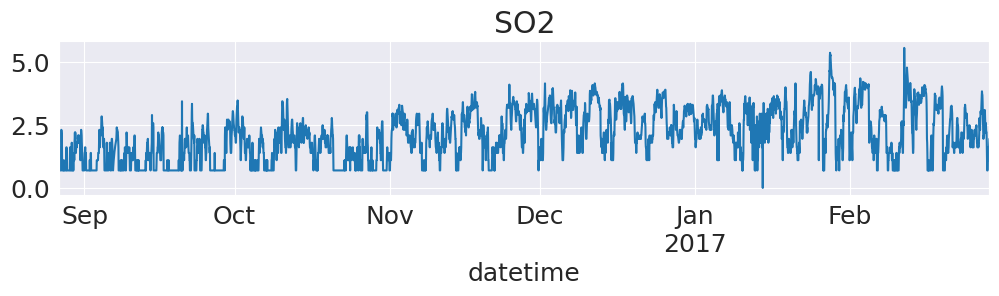

In [34]:
logged_so2 = so2_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_so2[-24*31*6:].plot(title='SO2')

## NO2 Series

<Axes: title={'center': 'NO2 Series'}, xlabel='datetime'>

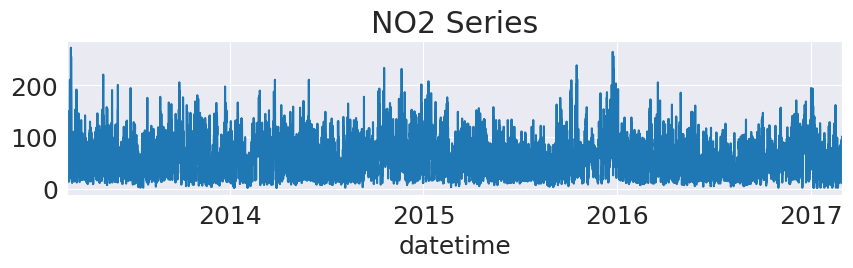

In [35]:
no2_data = No['NO2']

plt.figure(figsize=(10,2))
no2_data.plot(title='NO2 Series')

<Axes: title={'center': 'NO2 Series'}, xlabel='datetime'>

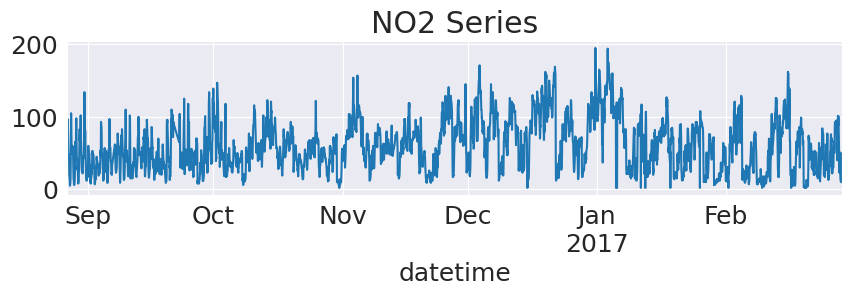

In [36]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
no2_data.iloc[-24*31*6:].plot(title='NO2 Series')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

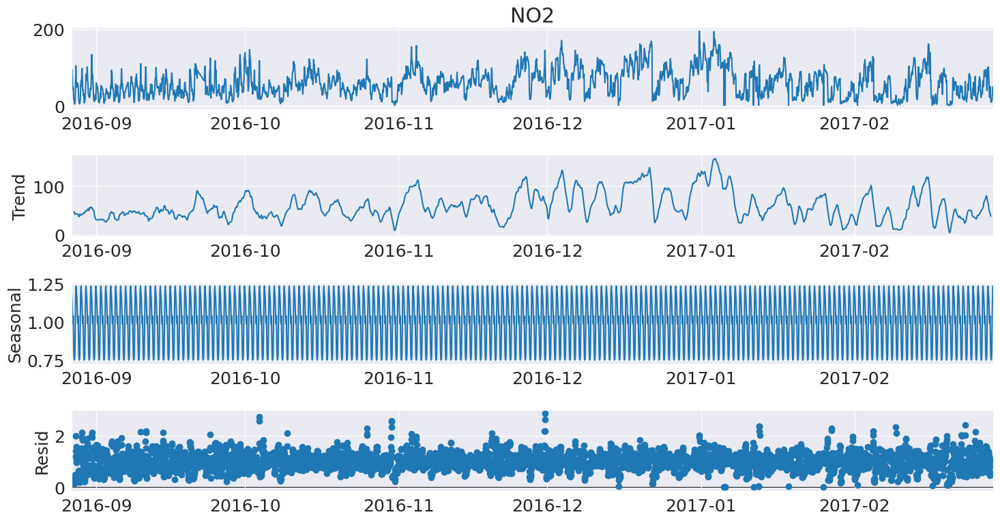

In [37]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(no2_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

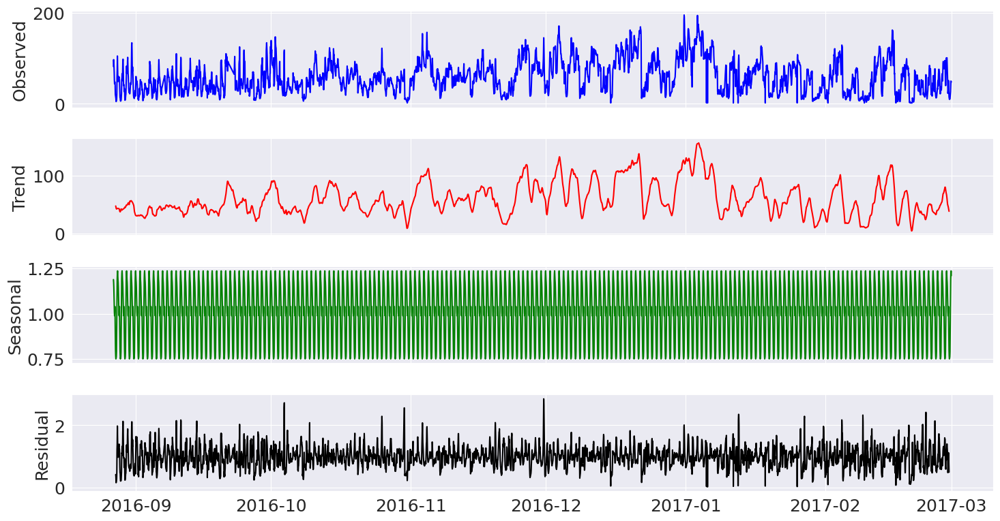

In [38]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [39]:
test_for_stationarity_single(no2_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'NO2'}, xlabel='datetime'>

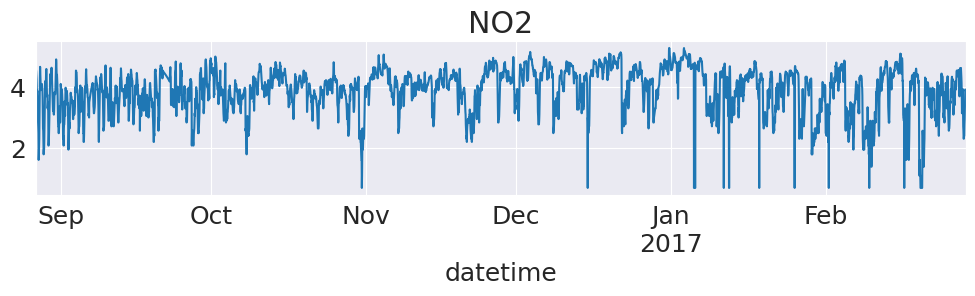

In [40]:
logged_no2 = no2_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_no2[-24*31*6:].plot(title='NO2')

## CO Series

<Axes: title={'center': 'CO Series'}, xlabel='datetime'>

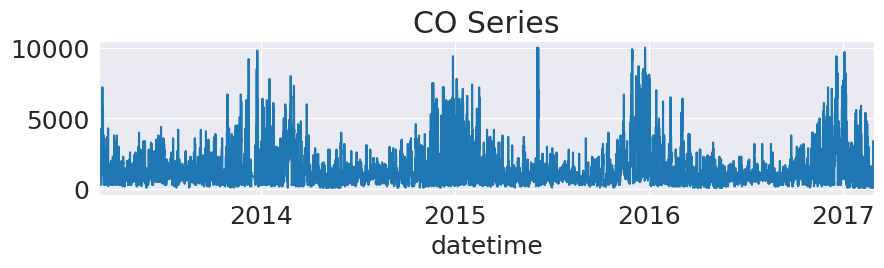

In [41]:
co_data = No['CO']

plt.figure(figsize=(10,2))
co_data.plot(title='CO Series')

<Axes: title={'center': 'CO Series'}, xlabel='datetime'>

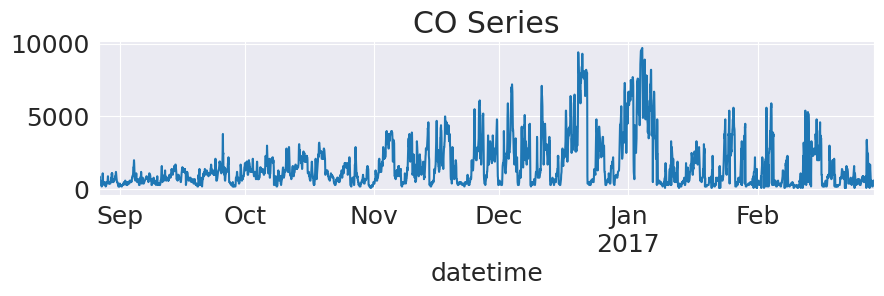

In [42]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
co_data.iloc[-24*31*6:].plot(title='CO Series')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

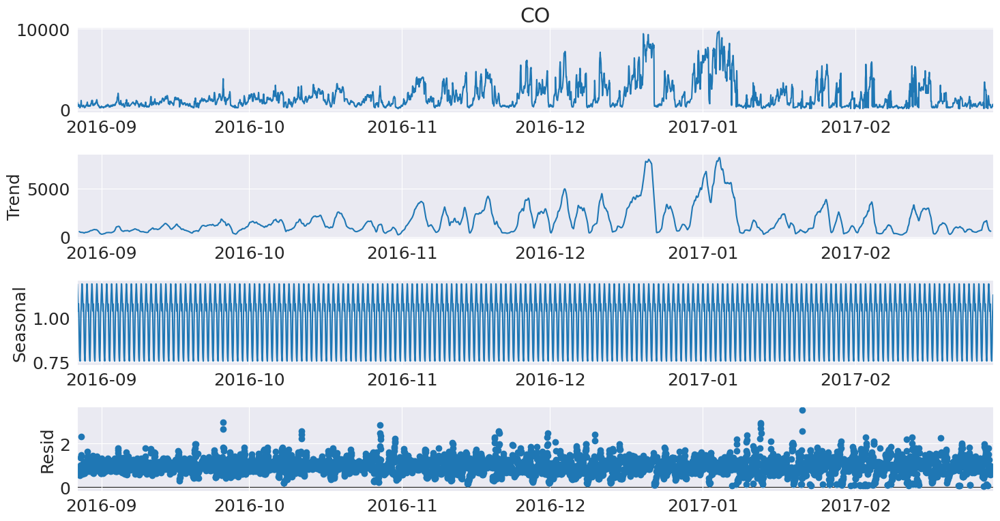

In [43]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(co_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

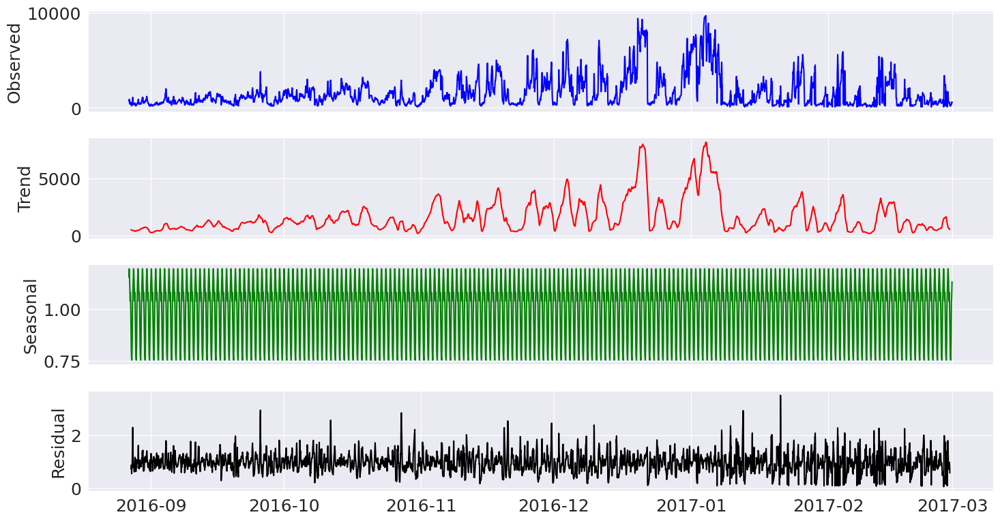

In [44]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [45]:
test_for_stationarity_single(co_data)

p-value: 0.000000
Series is stationary


<Axes: xlabel='datetime'>

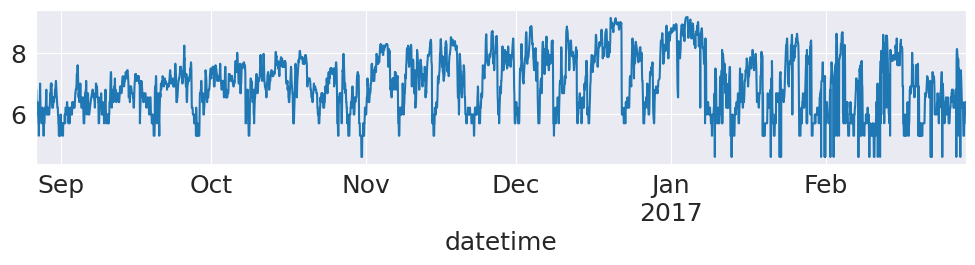

In [46]:
logged_co = co_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_co[-24*31*6:].plot()

## O3 Series

<Axes: title={'center': 'O3 Series'}, xlabel='datetime'>

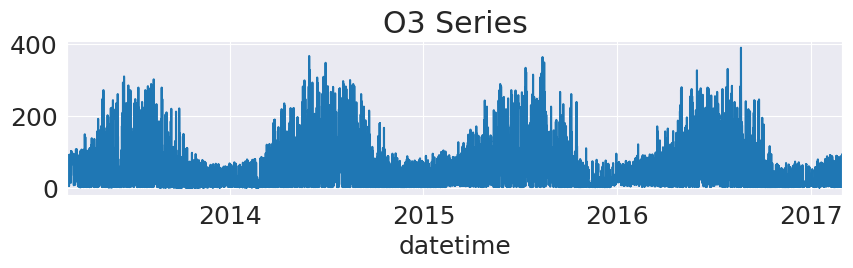

In [47]:
o3_data = No['O3']

plt.figure(figsize=(10,2))
o3_data.plot(title='O3 Series')

<Axes: title={'center': 'O3 Series'}, xlabel='datetime'>

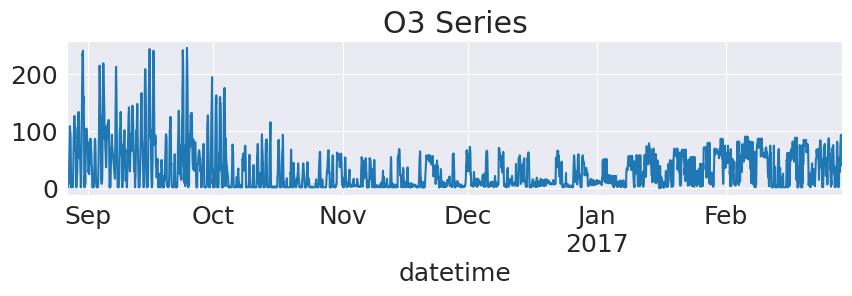

In [48]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
o3_data.iloc[-24*31*6:].plot(title='O3 Series')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

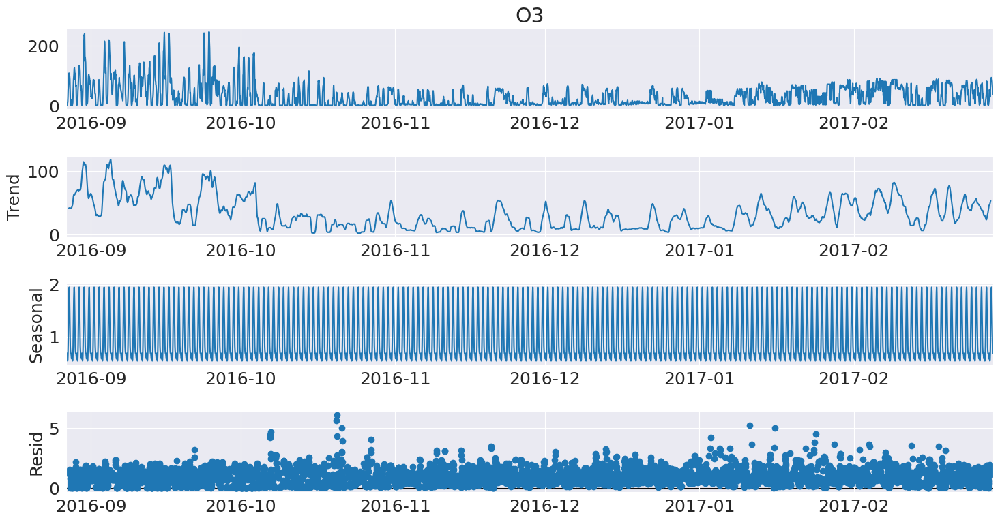

In [49]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(o3_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

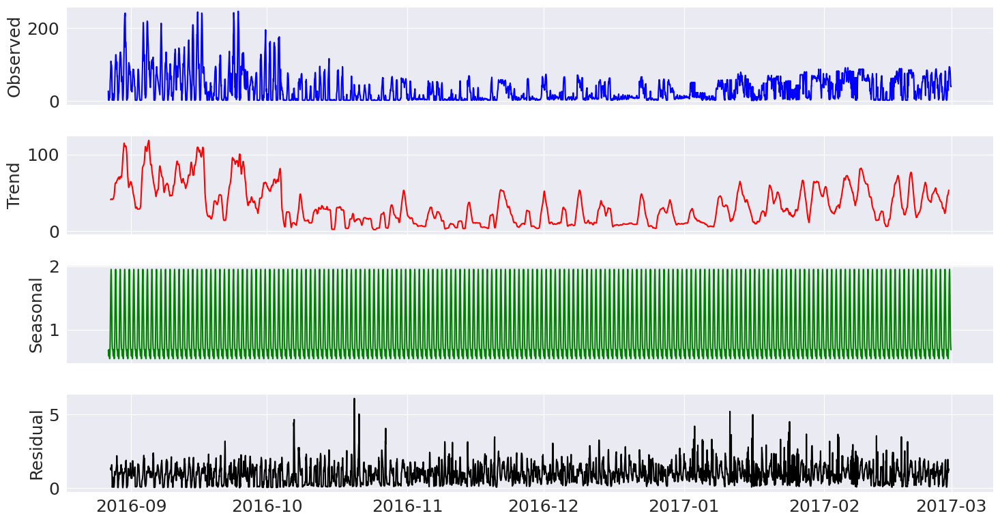

In [50]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [51]:
test_for_stationarity_single(o3_data)

p-value: 0.000000
Series is stationary


<Axes: xlabel='datetime'>

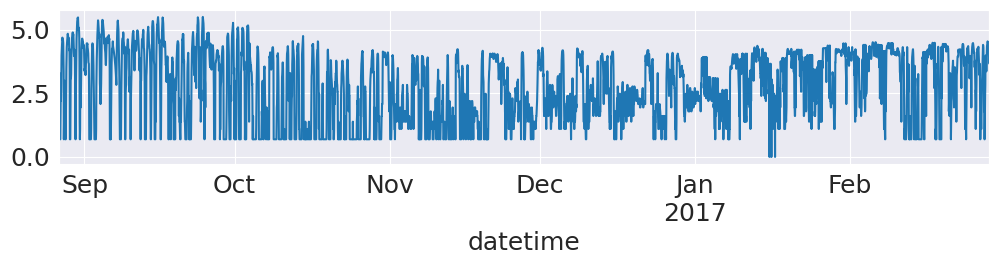

In [52]:
logged_o3 = o3_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_o3[-24*31*6:].plot()

# Analyzing Gucheng Pollutants Series Data

In [57]:
Gc.head(3)

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,315.0,4.4,6.0,18.0,5.0,5.0,800.0,88.0
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,315.0,4.0,6.0,15.0,5.0,5.0,800.0,88.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,292.5,4.6,5.0,18.0,5.5,5.0,700.0,52.0


## PM2.5 Series

<Axes: title={'center': 'PM2.5 Series [Gucheng]'}, xlabel='datetime'>

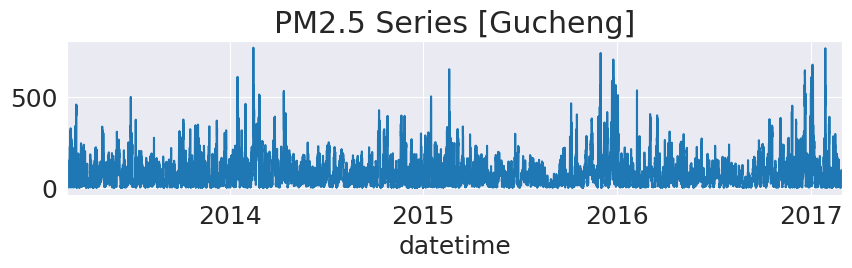

In [59]:
pm25_data = Gc['PM2.5']

plt.figure(figsize=(10,2))
pm25_data.plot(title='PM2.5 Series [Gucheng]')

<Axes: title={'center': 'PM2.5 Series [Gucheng]'}, xlabel='datetime'>

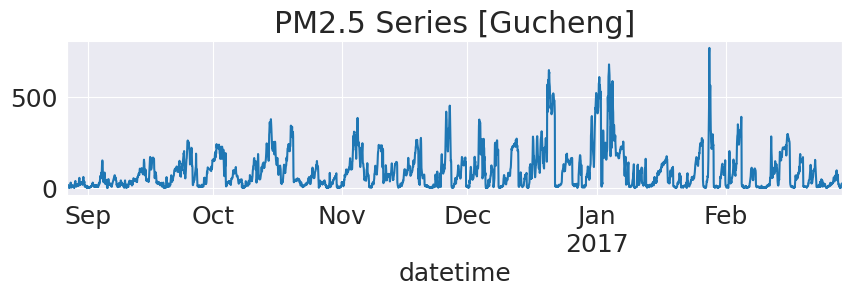

In [60]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
pm25_data.iloc[-24*31*6:].plot(title='PM2.5 Series [Gucheng]')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

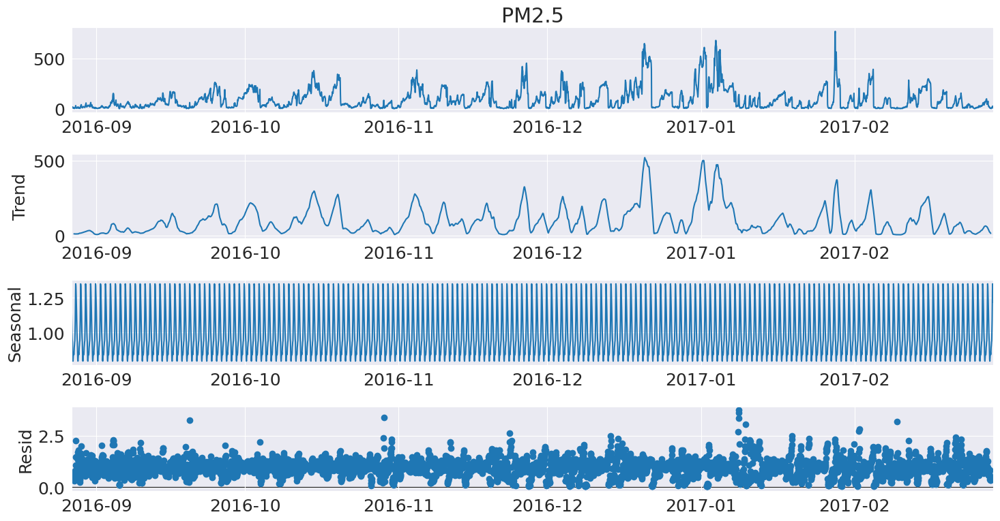

In [63]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(pm25_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

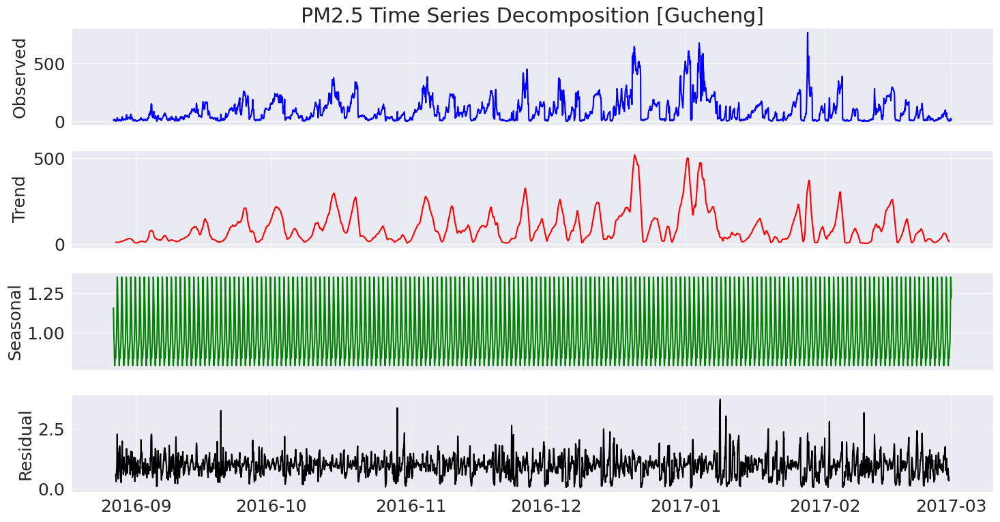

In [65]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[0].set_title('PM2.5 Time Series Decomposition [Gucheng]')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [ ]:
test_for_stationarity_single(pm25_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'Log-Transform of PM2.5  [Gucheng]'}, xlabel='datetime'>

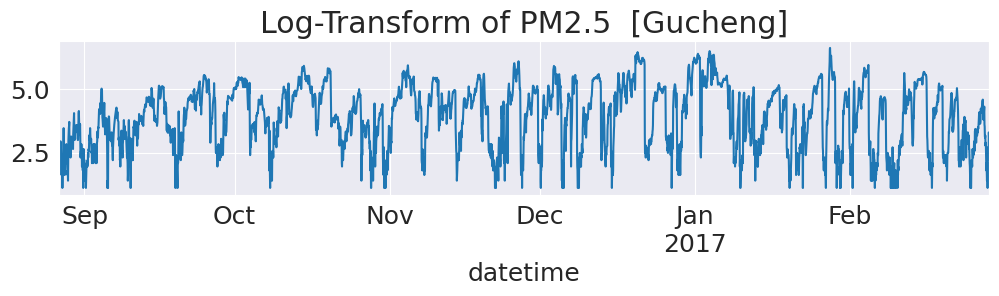

In [66]:
logged_pm25 = pm25_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_pm25[-24*31*6:].plot(title='Log-Transform of PM2.5  [Gucheng]')

## PM10 Series

<Axes: title={'center': 'PM10 Series  [Gucheng]'}, xlabel='datetime'>

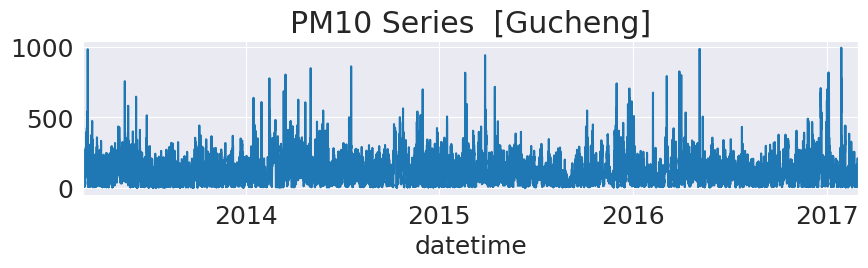

In [68]:
pm10_data = Gc['PM10']

plt.figure(figsize=(10,2))
pm10_data.plot(title='PM10 Series  [Gucheng]')

<Axes: title={'center': 'PM10 Series  [Gucheng]'}, xlabel='datetime'>

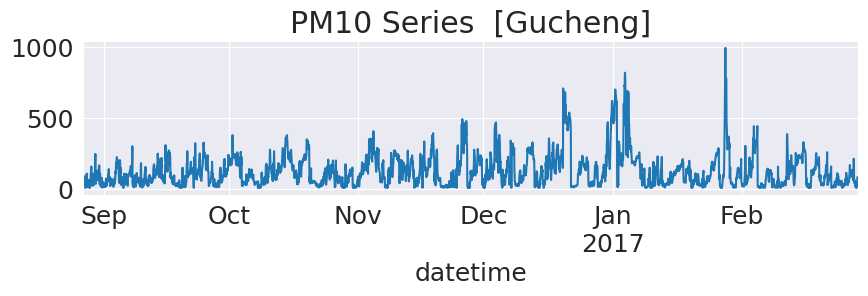

In [69]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
pm10_data.iloc[-24*31*6:].plot(title='PM10 Series  [Gucheng]')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

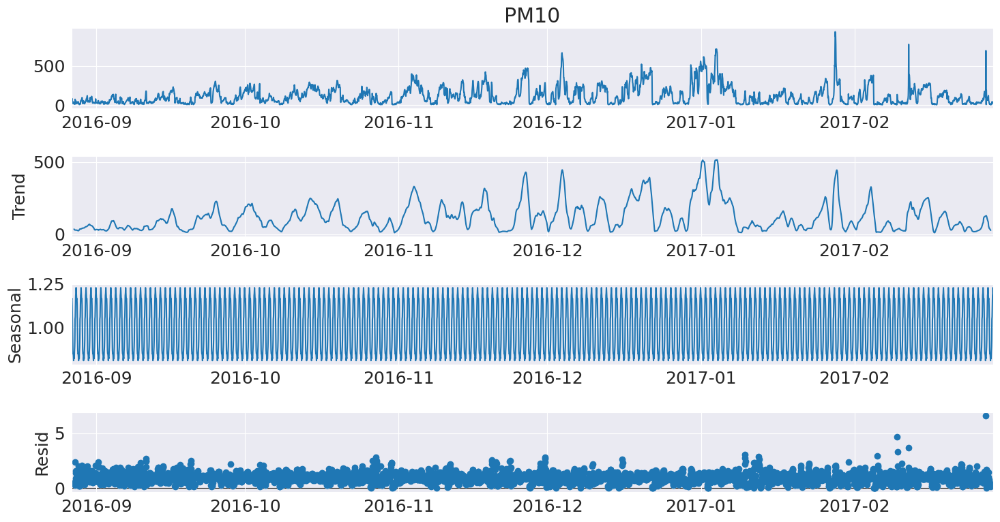

In [ ]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(pm10_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

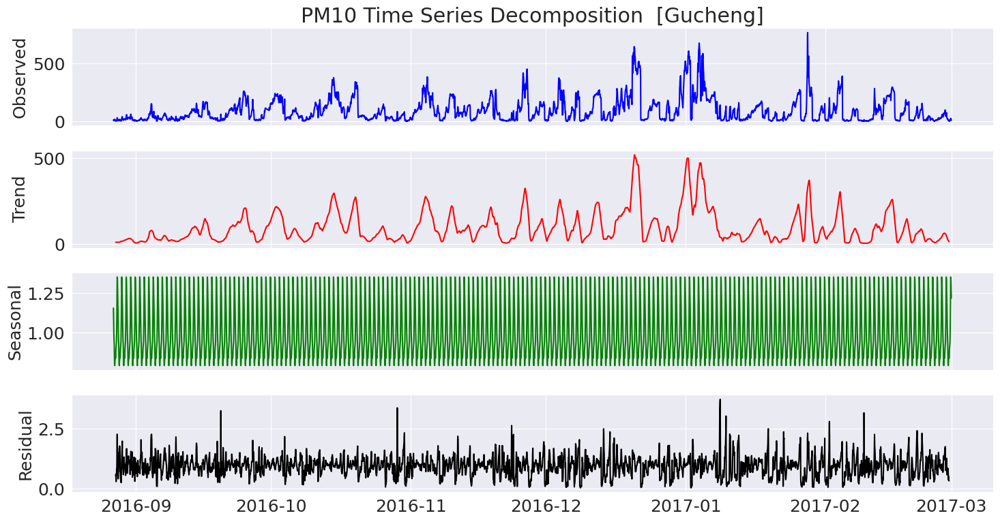

In [70]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[0].set_title('PM10 Time Series Decomposition  [Gucheng]')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [ ]:
test_for_stationarity_single(pm10_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'Log-Transform of PM10  [Gucheng]'}, xlabel='datetime'>

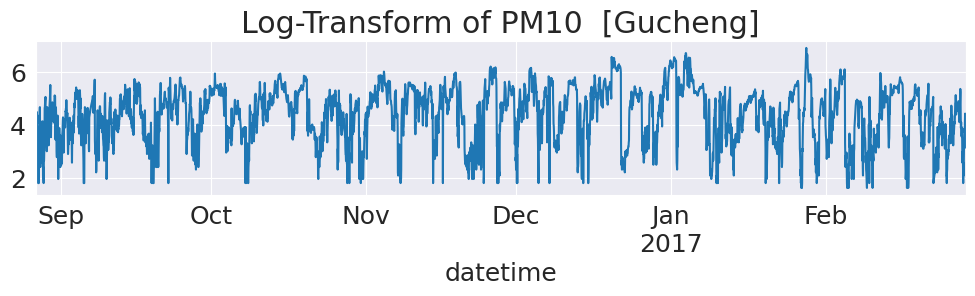

In [71]:
logged_pm10 = pm10_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_pm10[-24*31*6:].plot(title='Log-Transform of PM10  [Gucheng]')

## SO2 Series

<Axes: title={'center': 'SO2 Series  [Gucheng]'}, xlabel='datetime'>

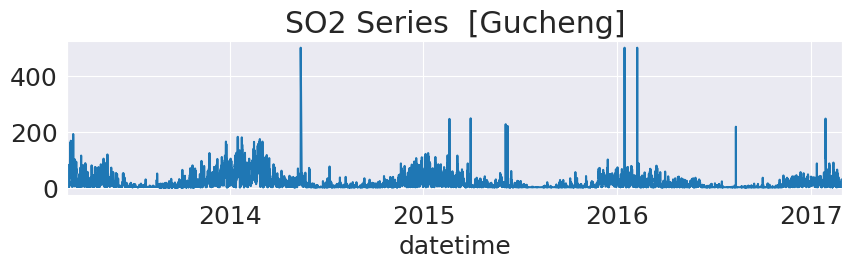

In [72]:
so2_data = Gc['SO2']

plt.figure(figsize=(10,2))
so2_data.plot(title='SO2 Series  [Gucheng]')

<Axes: title={'center': 'SO2 Series  [Gucheng]'}, xlabel='datetime'>

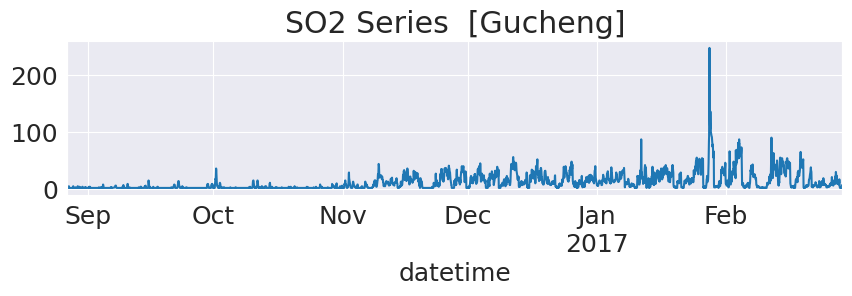

In [73]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
so2_data.iloc[-24*31*6:].plot(title='SO2 Series  [Gucheng]')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

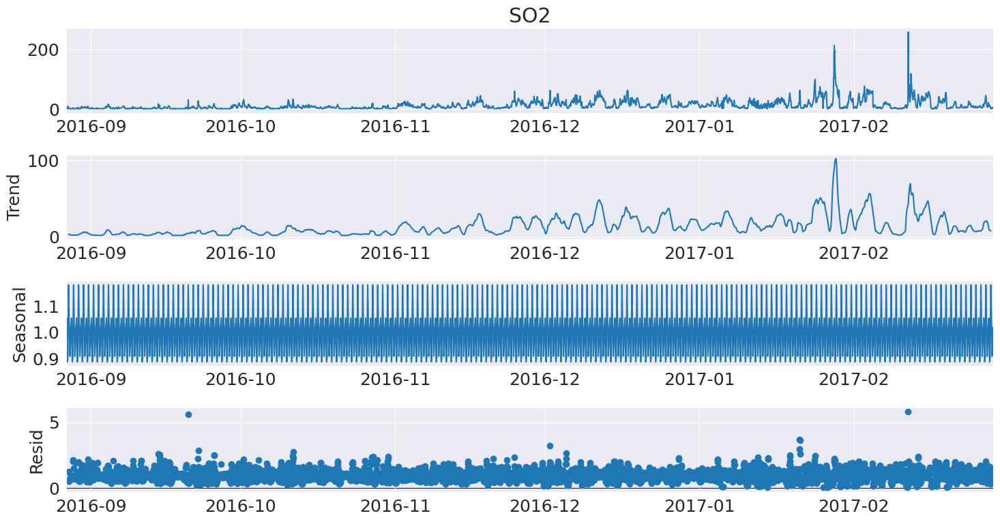

In [ ]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(so2_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

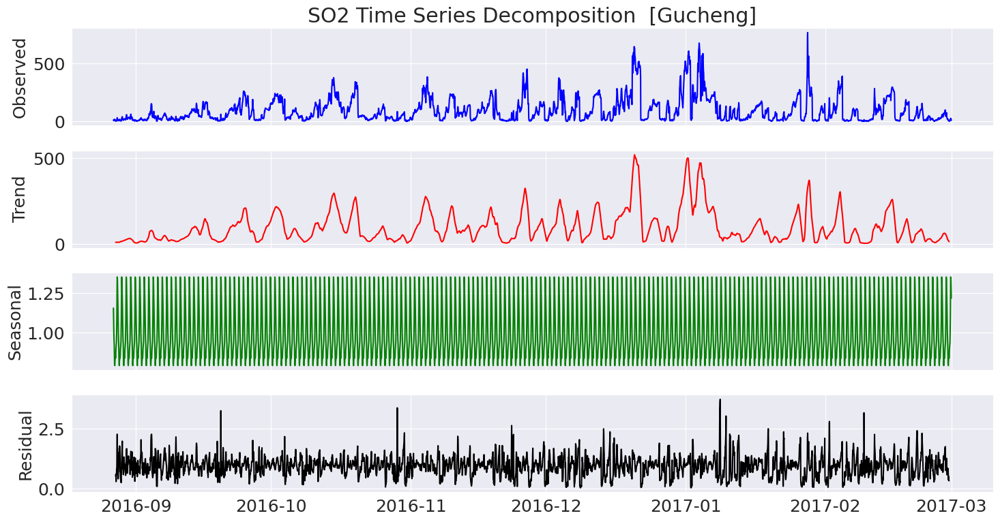

In [74]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[0].set_title('SO2 Time Series Decomposition  [Gucheng]')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [ ]:
test_for_stationarity_single(so2_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'Log-Transform of SO2 [Gucheng]'}, xlabel='datetime'>

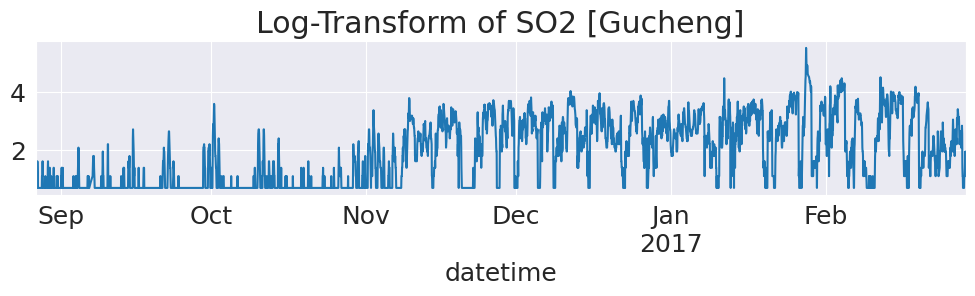

In [76]:
logged_so2 = so2_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_so2[-24*31*6:].plot(title='Log-Transform of SO2 [Gucheng]')

## NO2 Series

<Axes: title={'center': 'NO2 Series  [Gucheng]'}, xlabel='datetime'>

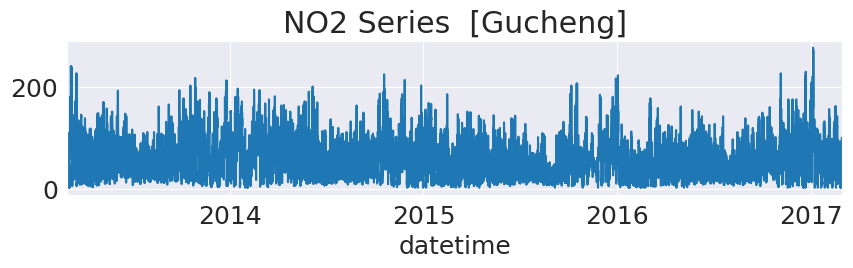

In [77]:
no2_data = Gc['NO2']

plt.figure(figsize=(10,2))
no2_data.plot(title='NO2 Series  [Gucheng]')

<Axes: title={'center': 'NO2 Series  [Gucheng]'}, xlabel='datetime'>

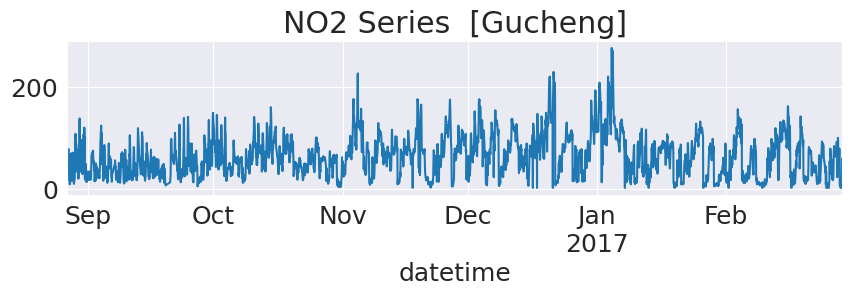

In [78]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
no2_data.iloc[-24*31*6:].plot(title='NO2 Series  [Gucheng]')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

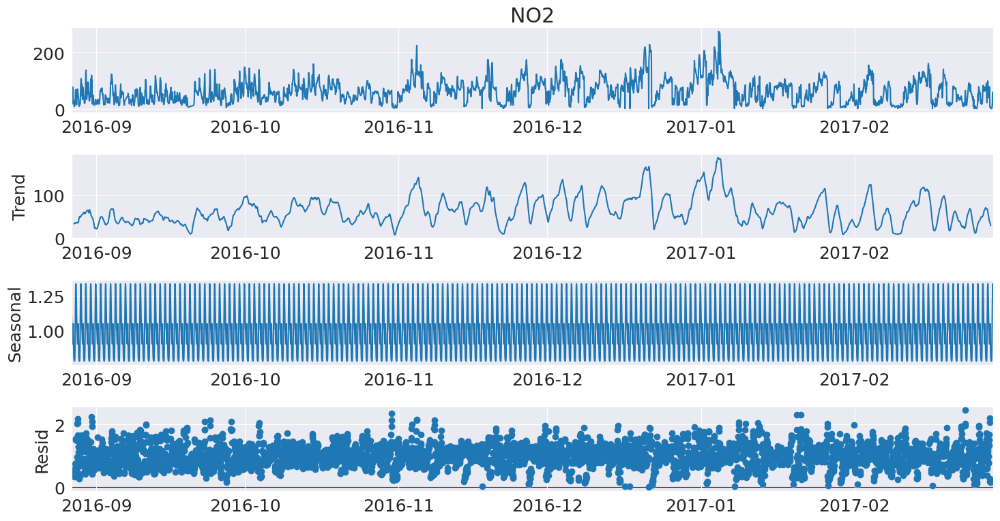

In [79]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(no2_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

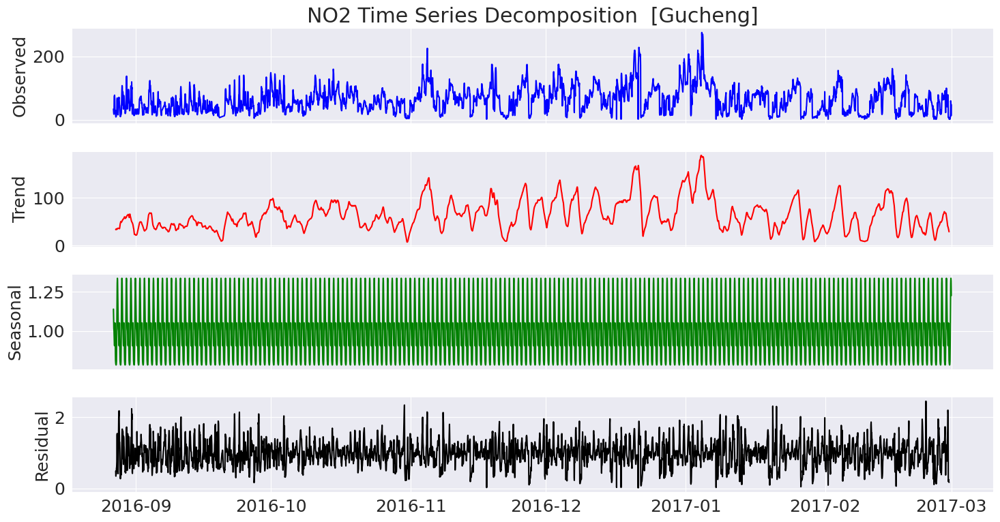

In [80]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[0].set_title('NO2 Time Series Decomposition  [Gucheng]')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [ ]:
test_for_stationarity_single(no2_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'Log-Transform of NO2 Series  [Gucheng]\n'}, xlabel='datetime'>

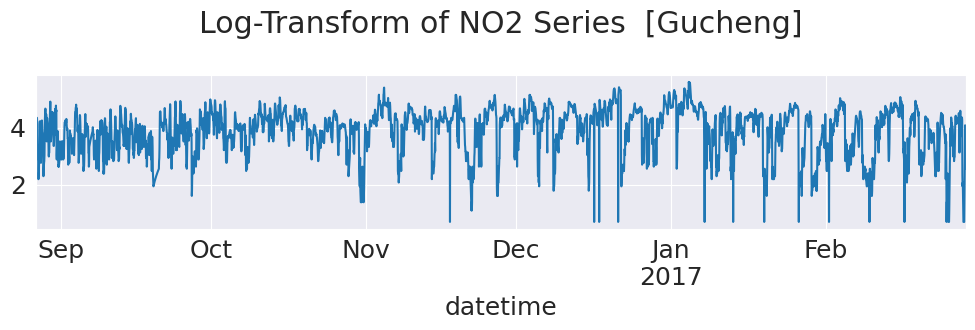

In [82]:
logged_no2 = no2_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_no2[-24*31*6:].plot(title='Log-Transform of NO2 Series  [Gucheng]\n')

## CO Series

<Axes: title={'center': 'CO Series  [Gucheng]'}, xlabel='datetime'>

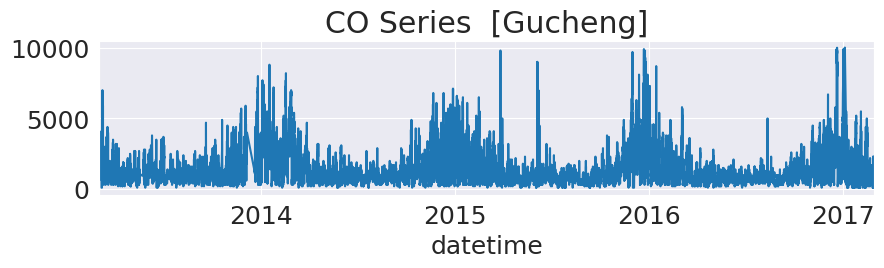

In [83]:
co_data = Gc['CO']

plt.figure(figsize=(10,2))
co_data.plot(title='CO Series  [Gucheng]')

<Axes: title={'center': 'CO Series  [Gucheng]'}, xlabel='datetime'>

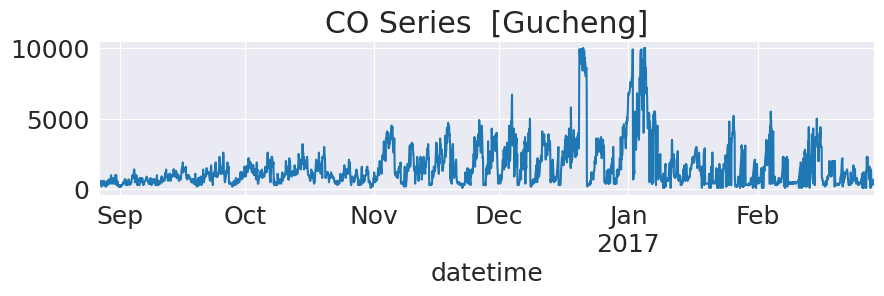

In [84]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
co_data.iloc[-24*31*6:].plot(title='CO Series  [Gucheng]')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

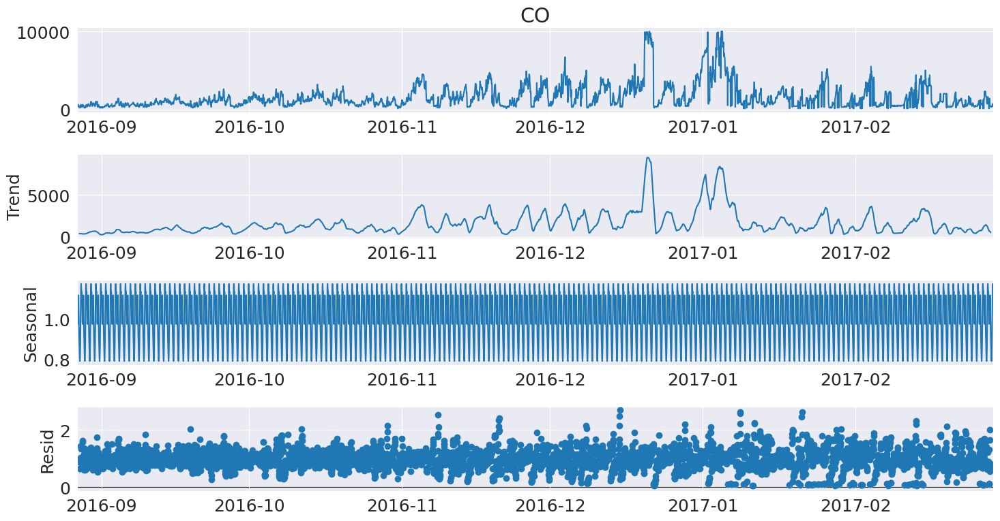

In [85]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(co_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

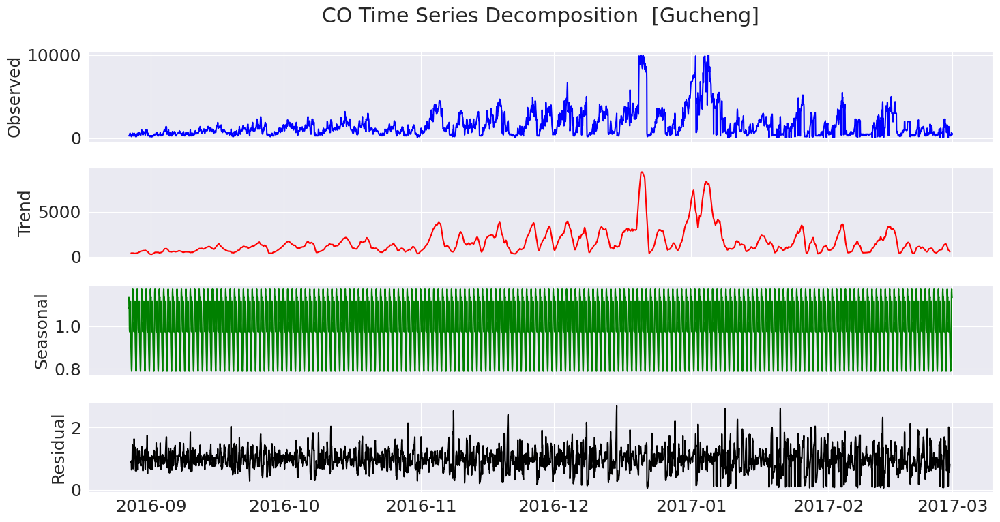

In [87]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[0].set_title('CO Time Series Decomposition  [Gucheng]\n')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [88]:
test_for_stationarity_single(co_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'Log-Transform of CO Series [Gucheng]\n'}, xlabel='datetime'>

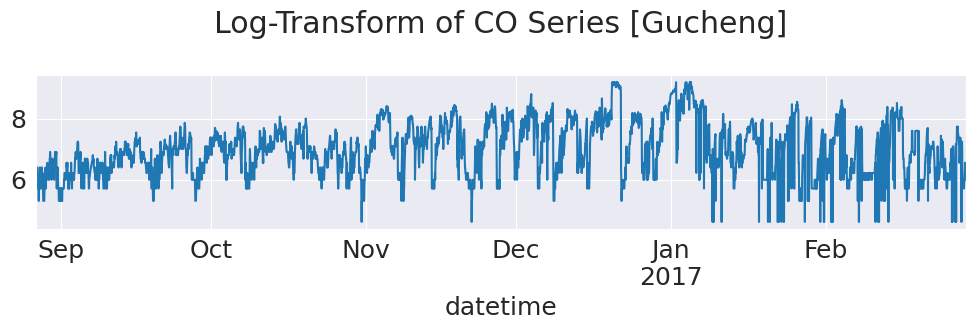

In [90]:
logged_co = co_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_co[-24*31*6:].plot(title='Log-Transform of CO Series [Gucheng]\n')

## O3 Series

<Axes: title={'center': 'O3 Series [Gucheng]\n'}, xlabel='datetime'>

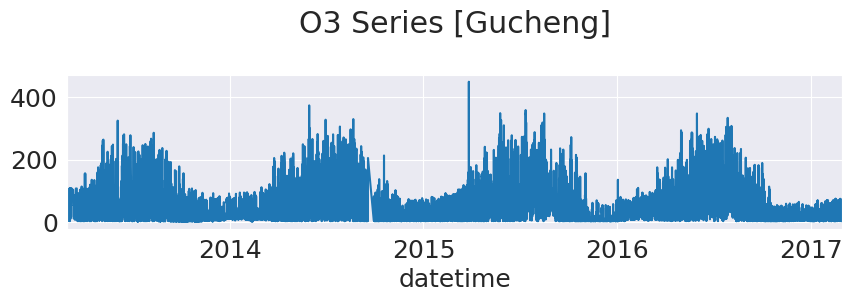

In [92]:
o3_data = Gc['O3']

plt.figure(figsize=(10,2))
o3_data.plot(title='O3 Series [Gucheng]\n')

<Axes: title={'center': 'O3 Series [Gucheng]\n'}, xlabel='datetime'>

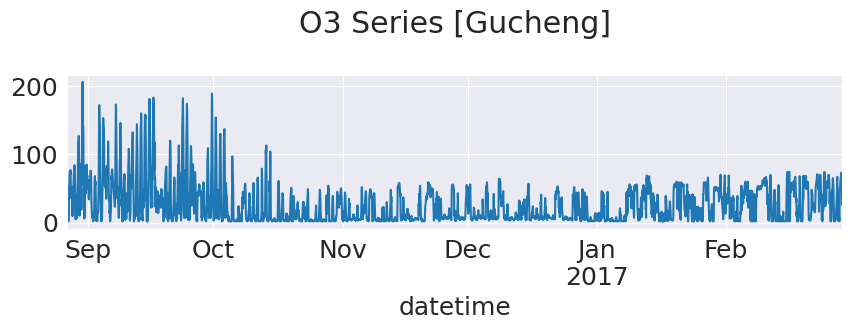

In [94]:
# Last 6 months (To understand pattern)
plt.figure(figsize=(10,2))
o3_data.iloc[-24*31*6:].plot(title='O3 Series [Gucheng]\n')

### Decomposing series

**As shown in the plot above, Series has varying incresing and decreasing seasonality over time. So, we decompose using multiplicative decomposition model, to understand its seasonal and trend components**

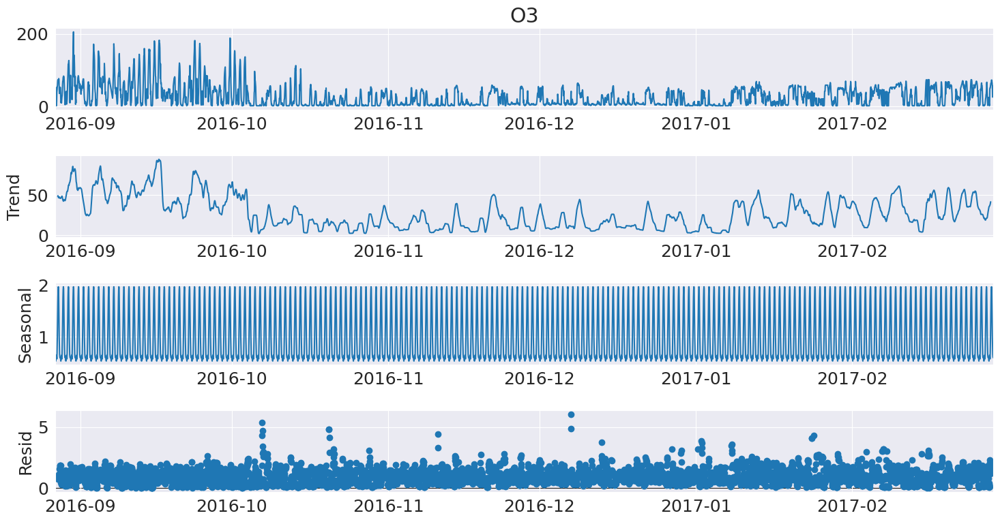

In [95]:
# Decomposing Series into its trend and seasonal components
results = decompose_series_single(o3_data[-24*31*6:], model='multiplicative') # last 6 months

<Figure size 2400x900 with 0 Axes>

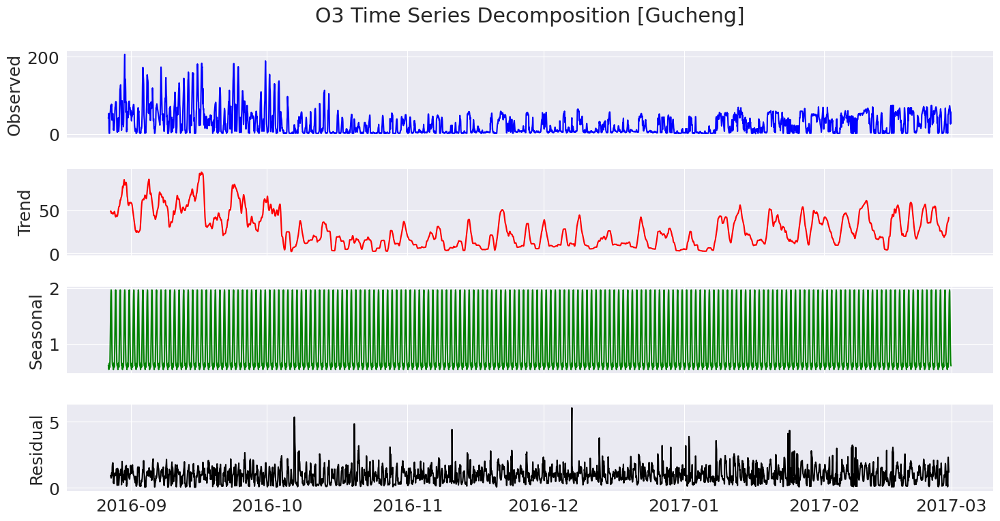

In [97]:
plt.figure(figsize=(16, 6), dpi=150)
fig, ax = plt.subplots(4, sharex=True)

ax[0].plot(results.observed, color='blue')
ax[0].set_title('O3 Time Series Decomposition [Gucheng]\n')
ax[1].plot(results.trend, color='red')
ax[2].plot(results.seasonal, color='green')
ax[3].plot(results.resid, color='black')
ax[0].set_ylabel('Observed')
ax[1].set_ylabel('Trend')
ax[2].set_ylabel('Seasonal')
ax[3].set_ylabel('Residual')

fig.tight_layout()
 

### Checking whether series is stationary
using adfuler test

In [ ]:
test_for_stationarity_single(o3_data)

p-value: 0.000000
Series is stationary


<Axes: title={'center': 'Log-Transform of O3 Series [Gucheng]\n'}, xlabel='datetime'>

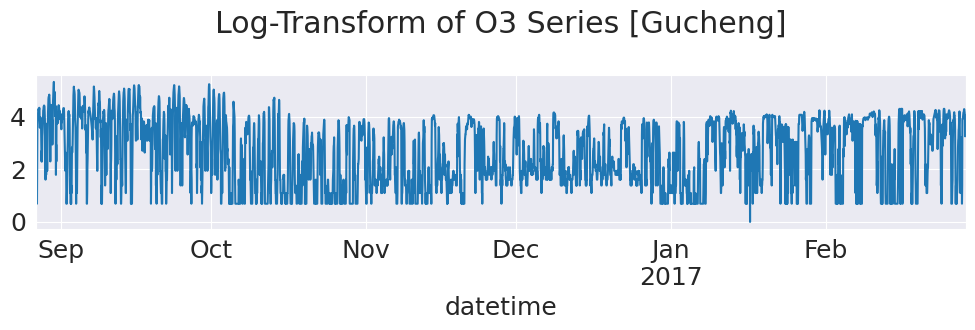

In [100]:
logged_o3 = o3_data.apply(np.log)

plt.figure(figsize=(12,2))
logged_o3[-24*31*6:].plot(title='Log-Transform of O3 Series [Gucheng]\n')

# Exploring the Performance of the Meterological Data in Predicting the within-period Pollutant values

# CORRELATION ANALYSIS

## Nongzhang Station

In [ ]:
No.head()

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,-0.5,1024.5,-21.4,0.0,337.5,5.7,5.0,14.0,4.0,12.0,200.0,85.0
2013-03-01 01:00:00,-0.7,1025.1,-22.1,0.0,315.0,3.9,8.0,12.0,6.0,14.0,200.0,84.0
2013-03-01 02:00:00,-1.2,1025.3,-24.6,0.0,337.5,5.3,3.0,6.0,5.0,14.0,200.0,83.0
2013-03-01 03:00:00,-1.4,1026.2,-25.5,0.0,360.0,4.9,5.0,5.0,5.0,14.0,200.0,84.0
2013-03-01 04:00:00,-1.9,1027.1,-24.5,0.0,337.5,3.2,5.0,5.0,6.0,21.0,200.0,77.0


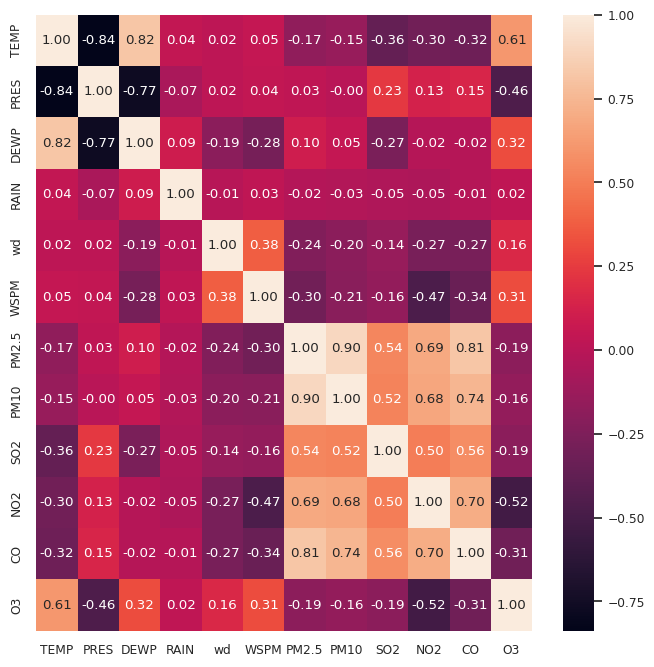

In [138]:
plt.figure(figsize=(8,8))
sns.heatmap(No.corr(), annot=True, fmt='.2f')
sns.set(font_scale=0.8)

### Data Segmentation

In [ ]:
features_X = No[No.columns[:6]]
y_pm25 = No['PM2.5']
y_pm10 = No.PM10
y_so2 = No.SO2
y_no2 = No.NO2
y_co = No.CO
y_o3 = No.O3

In [ ]:
features_X.head(3)

,TEMP,PRES,DEWP,RAIN,wd,WSPM
datetime,,,,,,
2013-03-01 00:00:00,-0.5,1024.5,-21.4,0.0,337.5,5.7
2013-03-01 01:00:00,-0.7,1025.1,-22.1,0.0,315.0,3.9
2013-03-01 02:00:00,-1.2,1025.3,-24.6,0.0,337.5,5.3


In [ ]:
y_pm25.head(3)

datetime
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    8.0
2013-03-01 02:00:00    7.0
Name: PM2.5, dtype: float64

### Feature Correlations with Pollutant AQIs

In [104]:
# Feature Correlation with PM2.5

features_X.corrwith(y_pm25).sort_values(ascending=False)

DEWP    0.097226
PRES    0.028121
RAIN   -0.022705
TEMP   -0.173362
wd     -0.240711
WSPM   -0.301098
dtype: float64

<Axes: title={'center': 'Features correlations with PM2.5\n'}>

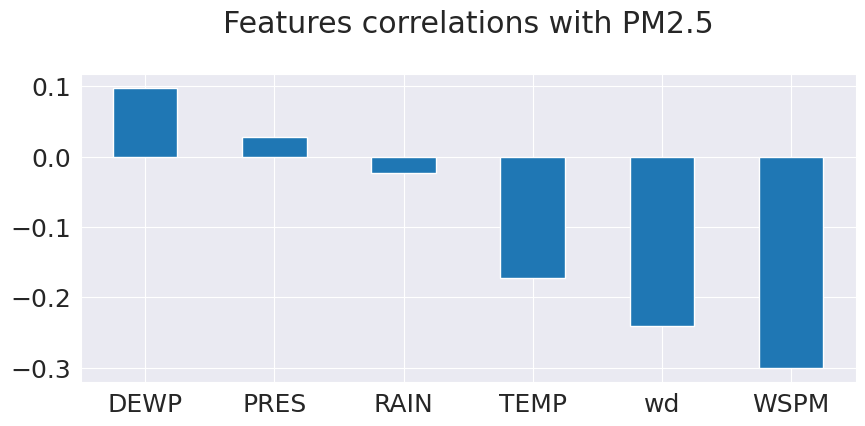

In [108]:
features_X.corrwith(y_pm25).sort_values(ascending=False).plot.bar(
    title='Features correlations with PM2.5\n', figsize=(10,4), rot=0)

In [109]:
# Feature Correlation with PM10

features_X.corrwith(y_pm10).sort_values(ascending=False)

DEWP    0.050930
PRES   -0.002061
RAIN   -0.033133
TEMP   -0.145445
wd     -0.196780
WSPM   -0.205768
dtype: float64

<Axes: title={'center': 'Features correlations with PM10\n'}>

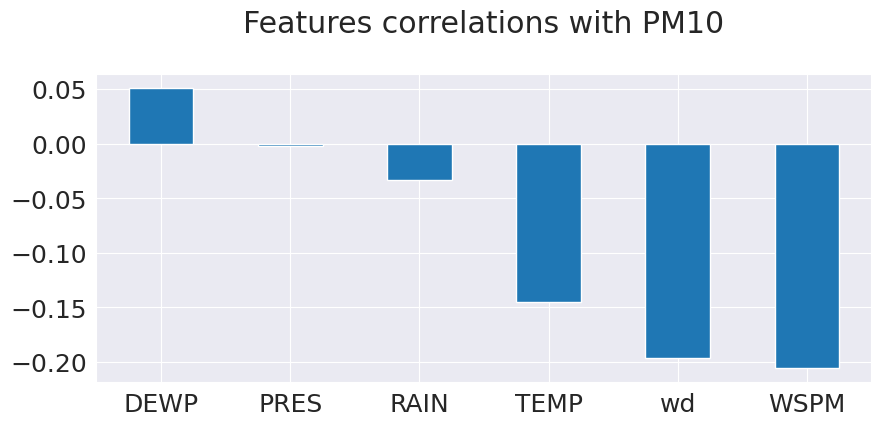

In [111]:
features_X.corrwith(y_pm10).sort_values(ascending=False).plot.bar(
    title='Features correlations with PM10\n', figsize=(10,4), rot=0)

In [112]:
# Feature Correlation with SO2

features_X.corrwith(y_so2).sort_values(ascending=False)

PRES    0.232758
RAIN   -0.045236
wd     -0.142459
WSPM   -0.155726
DEWP   -0.265932
TEMP   -0.360466
dtype: float64

<Axes: title={'center': 'Features correlations with SO2\n'}>

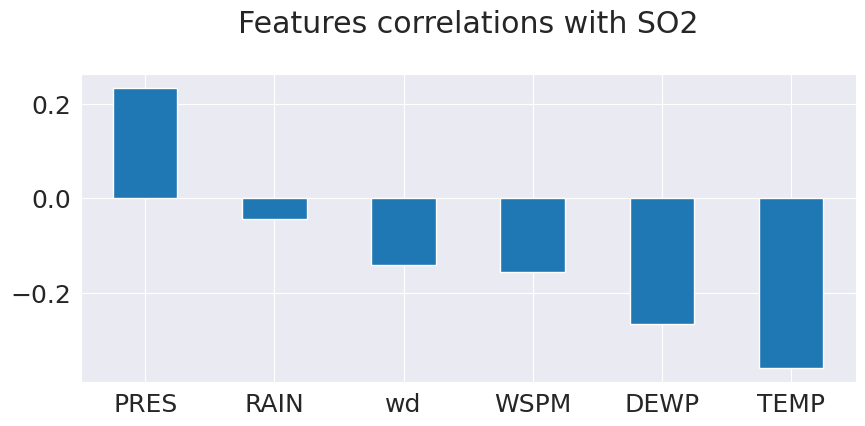

In [113]:
features_X.corrwith(y_so2).sort_values(ascending=False).plot.bar(
    title='Features correlations with SO2\n', figsize=(10,4), rot=0)

In [114]:
# Feature Correlation with NO2

features_X.corrwith(y_no2).sort_values(ascending=False)

PRES    0.129807
DEWP   -0.018488
RAIN   -0.051769
wd     -0.271042
TEMP   -0.302299
WSPM   -0.467683
dtype: float64

<Axes: title={'center': 'Features correlations with NO2\n'}>

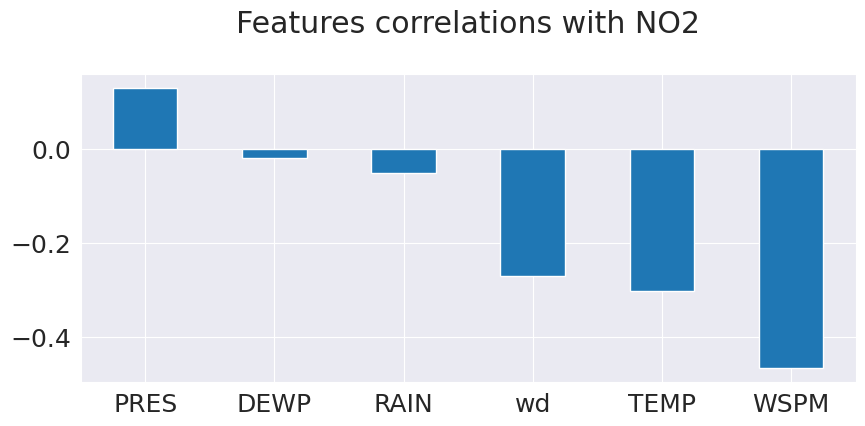

In [115]:
features_X.corrwith(y_no2).sort_values(ascending=False).plot.bar(
    title='Features correlations with NO2\n', figsize=(10,4), rot=0)

In [116]:
# Feature Correlation with CO

features_X.corrwith(y_co).sort_values(ascending=False)

PRES    0.149046
RAIN   -0.013407
DEWP   -0.017588
wd     -0.273088
TEMP   -0.317610
WSPM   -0.338262
dtype: float64

<Axes: title={'center': 'Features correlations with CO\n'}>

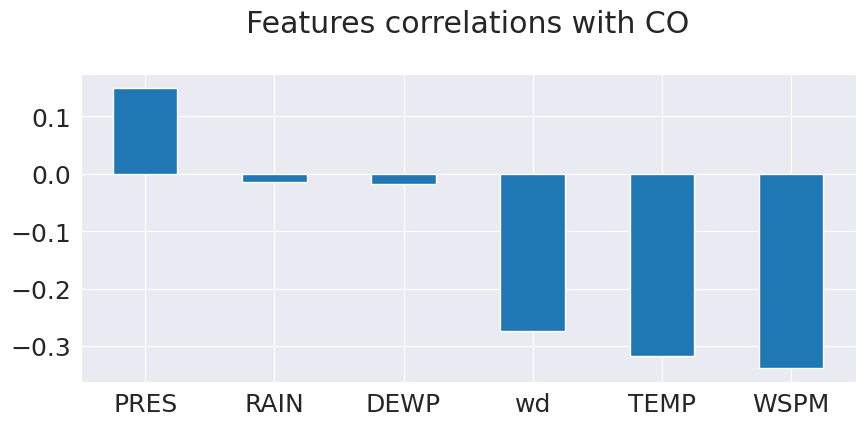

In [117]:
features_X.corrwith(y_co).sort_values(ascending=False).plot.bar(
    title='Features correlations with CO\n', figsize=(10,4), rot=0)

In [118]:
# Feature Correlation with O3

features_X.corrwith(y_o3).sort_values(ascending=False)

TEMP    0.609599
DEWP    0.316142
WSPM    0.312668
wd      0.163402
RAIN    0.024020
PRES   -0.457998
dtype: float64

<Axes: title={'center': 'Features correlations with O3\n'}>

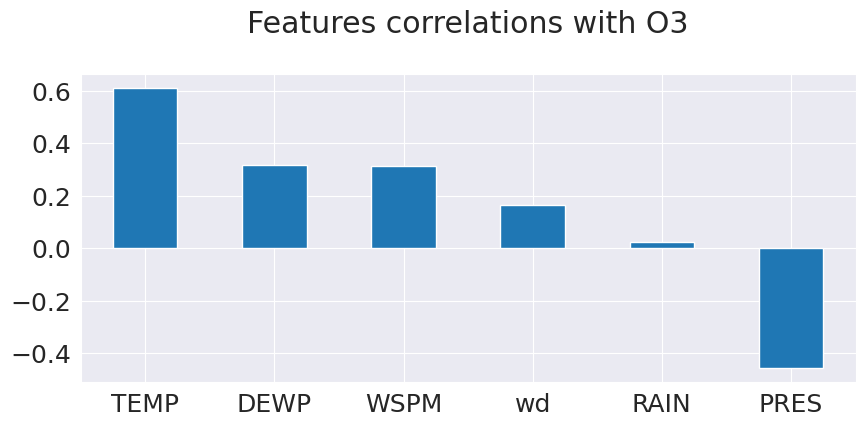

In [119]:
features_X.corrwith(y_o3).sort_values(ascending=False).plot.bar(
    title='Features correlations with O3\n', figsize=(10,4), rot=0)

## Gucheng Station

In [120]:
Gc.head()

,TEMP,PRES,DEWP,RAIN,wd,WSPM,PM2.5,PM10,SO2,NO2,CO,O3
datetime,,,,,,,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,315.0,4.4,6.0,18.0,5.0,5.0,800.0,88.0
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,315.0,4.0,6.0,15.0,5.0,5.0,800.0,88.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,292.5,4.6,5.0,18.0,5.5,5.0,700.0,52.0
2013-03-01 03:00:00,-1.0,1022.7,-21.2,0.0,270.0,2.8,6.0,20.0,6.0,5.0,650.0,62.5
2013-03-01 04:00:00,-1.3,1023.0,-21.4,0.0,292.5,3.6,5.0,17.0,5.0,5.0,600.0,73.0


Text(0.5, 1.0, 'Gucheng Data Correlation Plot\n')

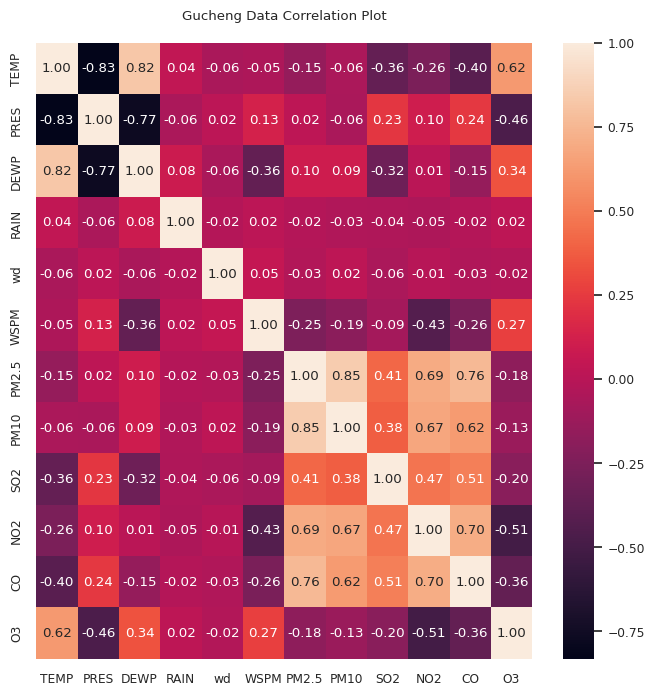

In [143]:
plt.figure(figsize=(8,8))
sns.heatmap(Gc.corr(), annot=True, fmt='.2f')
sns.set(font_scale=0.8)
plt.title('Gucheng Data Correlation Plot\n')

### Data Segmentation

In [144]:
features_X = Gc[Gc.columns[:6]]
y_pm25 = Gc['PM2.5']
y_pm10 = Gc.PM10
y_so2 = Gc.SO2
y_no2 = Gc.NO2
y_co = Gc.CO
y_o3 = Gc.O3

In [145]:
features_X.head(3)

,TEMP,PRES,DEWP,RAIN,wd,WSPM
datetime,,,,,,
2013-03-01 00:00:00,0.1,1021.1,-18.6,0.0,315.0,4.4
2013-03-01 01:00:00,-0.3,1021.5,-19.0,0.0,315.0,4.0
2013-03-01 02:00:00,-0.7,1021.5,-19.8,0.0,292.5,4.6


In [146]:
y_pm25.head(3)

datetime
2013-03-01 00:00:00    6.0
2013-03-01 01:00:00    6.0
2013-03-01 02:00:00    5.0
Name: PM2.5, dtype: float64

### Feature Correlations with Pollutant AQIs

In [158]:
sns.set(font_scale=0.8)

In [147]:
# Feature Correlation with PM2.5

features_X.corrwith(y_pm25).sort_values(ascending=False)

DEWP    0.097060
PRES    0.022596
RAIN   -0.020184
wd     -0.025076
TEMP   -0.145860
WSPM   -0.251702
dtype: float64

<Axes: title={'center': 'Features correlations with PM2.5 [Gucheng]\n'}>

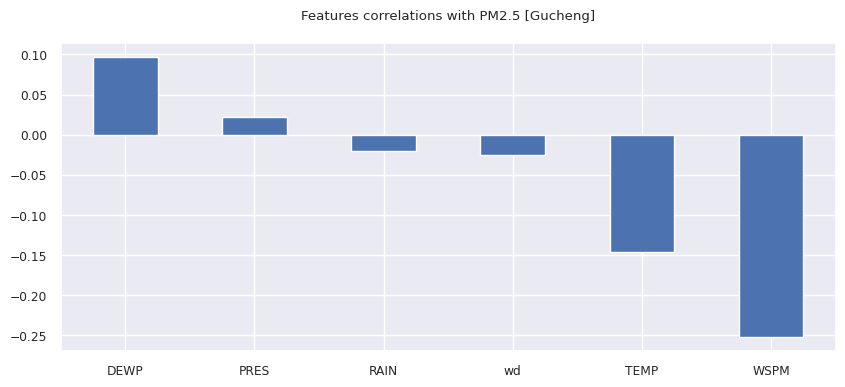

In [159]:
features_X.corrwith(y_pm25).sort_values(ascending=False).plot.bar(
    title='Features correlations with PM2.5 [Gucheng]\n', figsize=(10,4), rot=0)

In [149]:
# Feature Correlation with PM10

features_X.corrwith(y_pm10).sort_values(ascending=False)

DEWP    0.094748
wd      0.022963
RAIN   -0.032008
TEMP   -0.057599
PRES   -0.064551
WSPM   -0.190391
dtype: float64

<Axes: title={'center': 'Features correlations with PM10 [Gucheng]\n'}>

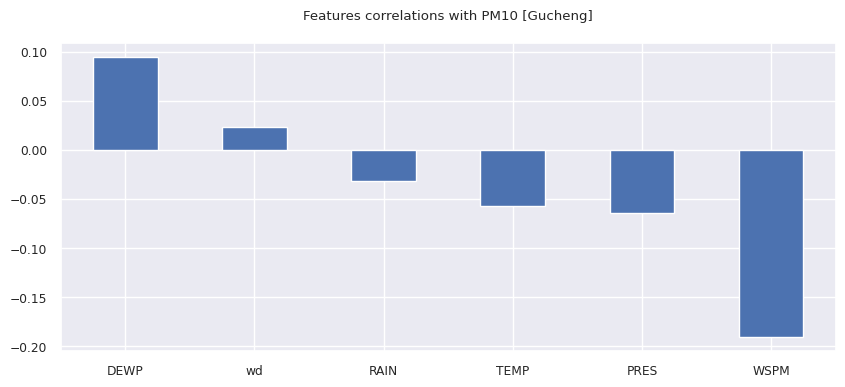

In [160]:
features_X.corrwith(y_pm10).sort_values(ascending=False).plot.bar(
    title='Features correlations with PM10 [Gucheng]\n', figsize=(10,4), rot=0)

In [151]:
# Feature Correlation with SO2

features_X.corrwith(y_so2).sort_values(ascending=False)

PRES    0.231286
RAIN   -0.040623
wd     -0.055017
WSPM   -0.087071
DEWP   -0.315368
TEMP   -0.356522
dtype: float64

<Axes: title={'center': 'Features correlations with SO2 [Gucheng]\n'}>

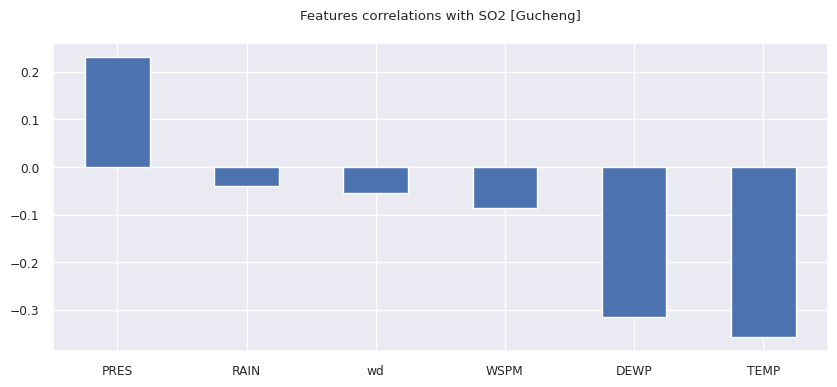

In [161]:
features_X.corrwith(y_so2).sort_values(ascending=False).plot.bar(
    title='Features correlations with SO2 [Gucheng]\n', figsize=(10,4), rot=0)

In [ ]:
# Feature Correlation with NO2

features_X.corrwith(y_no2).sort_values(ascending=False)

PRES    0.129807
DEWP   -0.018488
RAIN   -0.051769
wd     -0.271042
TEMP   -0.302299
WSPM   -0.467683
dtype: float64

<Axes: title={'center': 'Features correlations with NO2 [Gucheng]\n'}>

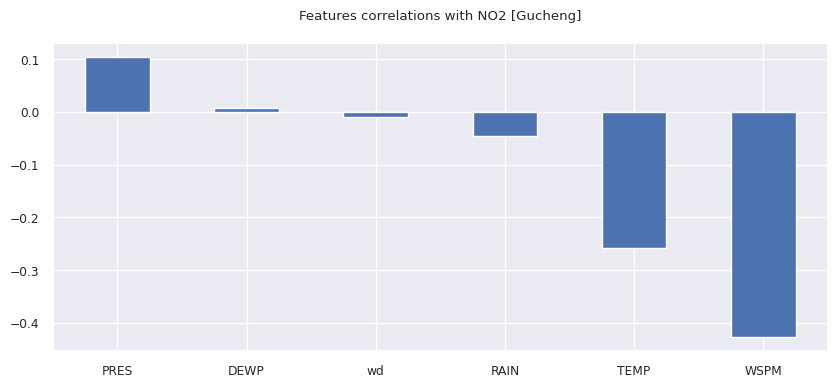

In [162]:
features_X.corrwith(y_no2).sort_values(ascending=False).plot.bar(
    title='Features correlations with NO2 [Gucheng]\n', figsize=(10,4), rot=0)

In [ ]:
# Feature Correlation with CO

features_X.corrwith(y_co).sort_values(ascending=False)

PRES    0.149046
RAIN   -0.013407
DEWP   -0.017588
wd     -0.273088
TEMP   -0.317610
WSPM   -0.338262
dtype: float64

<Axes: title={'center': 'Features correlations with CO [Gucheng]\n'}>

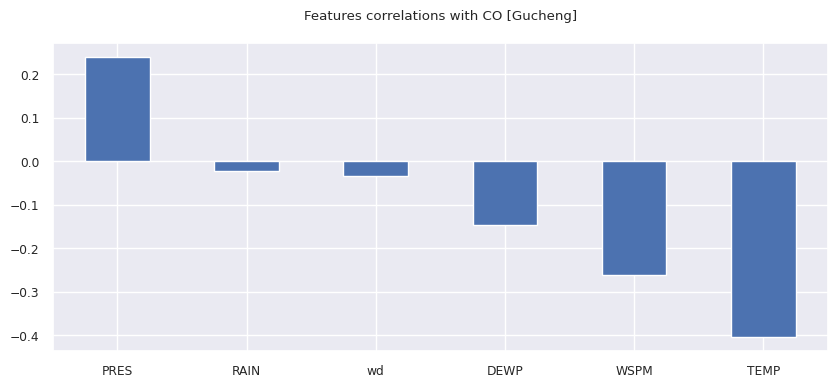

In [163]:
features_X.corrwith(y_co).sort_values(ascending=False).plot.bar(
    title='Features correlations with CO [Gucheng]\n', figsize=(10,4), rot=0)

In [ ]:
# Feature Correlation with O3

features_X.corrwith(y_o3).sort_values(ascending=False)

TEMP    0.609599
DEWP    0.316142
WSPM    0.312668
wd      0.163402
RAIN    0.024020
PRES   -0.457998
dtype: float64

<Axes: title={'center': 'Features correlations with O3 [Gucheng]\n'}>

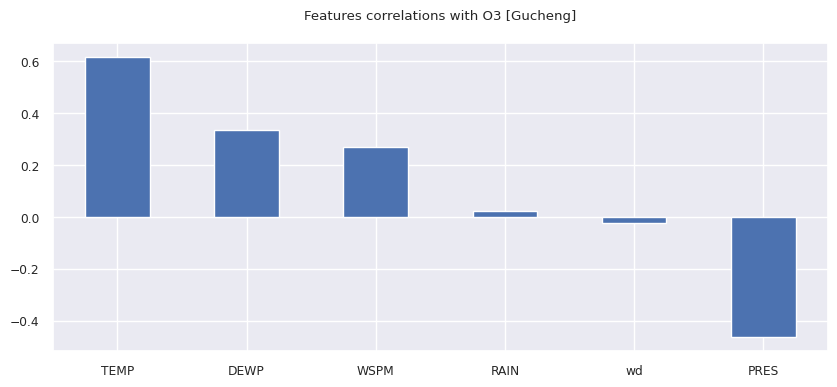

In [164]:
features_X.corrwith(y_o3).sort_values(ascending=False).plot.bar(
    title='Features correlations with O3 [Gucheng]\n', figsize=(10,4), rot=0)